#  Import deep learning libraries

In [1]:
!pwd

/home/ubuntu/courses_from_geonuma/courses/dl2/solarpanel/panel50


In [2]:
from arcgis.gis import GIS

import torch
from fastai.conv_learner import *
from fastai.dataset import *

In [3]:
from pathlib import Path
import json

from PIL import ImageDraw, ImageFont
from matplotlib import patches, patheffects
import matplotlib.pyplot as plt
import matplotlib.cm as cmx
import matplotlib.colors as mcolors
from cycler import cycler

import pickle

# Use training data

#### Load training data

In [4]:
# defining the PATH variable which will be used to save and load files
PATH = Path('/home/ubuntu/courses_from_geonuma/courses/dl2/solarpanel/panel50/')

# tilemapping is a dictionary which contains mapping from image to bounding boxes
tilemapping1 = pickle.load(open(PATH/'TILEMAPPING1.pkl', 'rb'))
tilemapping2 = pickle.load(open(PATH/'TILEMAPPING2.pkl', 'rb'))
tilemapping3 = pickle.load(open(PATH/'TILEMAPPING3.pkl', 'rb'))
tilemapping4 = pickle.load(open(PATH/'TILEMAPPING4.pkl', 'rb'))
tilemapping = {**tilemapping1, **tilemapping2, **tilemapping3, **tilemapping4}

len(tilemapping)

42762

In [5]:
tilemapping['0504_26.jpg']

[(0.425, 0.2625)]

In [6]:
del tilemapping['0504_26.jpg']

In [7]:
len(tilemapping)

42761

In [8]:
# This cells defines some utility functions for plotting

def get_color(text):
    if text=='bg':
        c = 'gray'
    elif text=='panel':
        c = 'white'
    else:
        c = 'yellow'
    return c

def draw_outline(obj, width):
    obj.set_path_effects([patheffects.Stroke(linewidth=width, foreground='black'), patheffects.Normal()])

def draw_bbox(ax, bbox, text=None, i=None, pr=None):    
    c = get_color(text)
    patch = ax.add_patch(patches.Rectangle(xy=(bbox[1], bbox[0]), width=bbox[3]-bbox[1],
                                           height=bbox[2]-bbox[0], 
                                           fill=False, edgecolor=c, lw=2))
    draw_outline(patch, 4)
    if i is not None:
        text = text
    if pr is not None:
        text = text + f' {pr:.2f}'
    if text is not None:
        t = ax.text(bbox[1], bbox[0], s=text, color='white', fontsize=12,
                    verticalalignment='bottom', weight='bold') #,bbox=dict(facecolor=c, pad=2))
        draw_outline(t, 1)

def draw_img_bboxes(ax, img, bboxes, classes=None, prs=None, thresh=0.3):
    
    if prs is None:  
        prs  = [None]*len(bboxes)
    if classes is None: 
        classes = [1]*len(bboxes)
    
    ax.set_yticklabels([])
    ax.set_xticklabels([])
    ax.imshow(img);
    for i, (bbox, c, pr) in enumerate(zip(bboxes, classes, prs)):
        if((bbox[3] - bbox[1] > 0) and (pr is None or pr > thresh)):
            try: cat = categories[c]
            except: cat = 'bg'
            draw_bbox(ax, bbox, cat, i, pr)
            
def draw_image(filename):
    fig, ax = plt.subplots(figsize=(4,4))
    img = open_image(PATH / 'images' / filename)
    
    bboxes=[]
    for center in tilemapping[filename]:
        bboxes.append(get_bbox(center))
        
    draw_img_bboxes(ax, img, bboxes)

In [109]:
# Define categories which the image contains
categories = {0: 'ground', 1: 'panel'}

sz = 224
objsize = 30


# In dataframe the bounding boxes coordinates are passed as string which are joined using spaces
# The following function convert bounding boxes to string
def get_bboxes_str(filename):
    bboxes = ''
    for center in tilemapping[filename]:
        bboxes = bboxes + ' '.join(str(c) for c in (get_bbox(center)))
        bboxes = bboxes + ' '
    return bboxes

# a function to convert bounding center location coordinates to boxxes
def get_bbox(center):
    xpix, ypix = int(sz*center[0]), int(sz*(1.0-center[1]))
        
    xmin, xmax = xpix - objsize//2, xpix + objsize//2 + 2
    ymin, ymax = ypix - objsize//2, ypix + objsize//2 + 2
    xmin = xmin # if xmin > 0 else 0
    ymin = ymin # if ymin > 0 else 0
    xmax = xmax # if xmax < sz else sz
    ymax = ymax # if ymax < sz else sz
    return [ymin, xmin, ymax, xmax]

bboxes_dict = {name: get_bboxes_str(name).strip()
                   for name, centers in tilemapping.items()}

# creating a pandas dataframe in the specific format
bboxes_df = pd.DataFrame.from_dict(bboxes_dict, orient='index').reset_index()
bboxes_df.columns = ['fn', 'bbox']

MULTIBOX_CSV = PATH/'bboxes.csv' # CSV file to use
bboxes_df.sort_values(by='fn', inplace=True)
bboxes_df.to_csv(MULTIBOX_CSV, index=False)
bboxes_df.head()

,fn,bbox
0,0000_00.jpg,167 153 199 185 69 53 101 85 60 66 92 98
1,0000_01.jpg,63 120 95 152 54 133 86 165
2,0000_03.jpg,111 169 143 201 13 69 45 101 4 83 36 115
3,0000_04.jpg,99 122 131 154 2 22 34 54 -7 35 25 67
4,0000_05.jpg,153 203 185 235 55 103 87 135 46 116 78 148


In [10]:
len(bboxes_df)

42761

In [11]:
bboxes_df[bboxes_df['fn']=='0000_00.jpg']

,fn,bbox
0,0000_00.jpg,167 153 199 185 69 53 101 85 60 66 92 98


In [12]:
bboxes_df[bboxes_df['fn']=='0504_26.jpg']

,fn,bbox


In [13]:
mydict = dict(zip(bboxes_df.fn, bboxes_df.bbox))

In [14]:
mydict

{'0000_00.jpg': '167 153 199 185 69 53 101 85 60 66 92 98',
 '0000_01.jpg': '63 120 95 152 54 133 86 165',
 '0000_03.jpg': '111 169 143 201 13 69 45 101 4 83 36 115',
 '0000_04.jpg': '99 122 131 154 2 22 34 54 -7 35 25 67',
 '0000_05.jpg': '153 203 185 235 55 103 87 135 46 116 78 148',
 '0000_06.jpg': '133 153 165 185 35 53 67 85 26 66 58 98',
 '0000_07.jpg': '-10 111 22 143',
 '0000_08.jpg': '46 144 78 176',
 '0000_10.jpg': '1 133 33 165',
 '0000_13.jpg': '200 147 232 179 102 47 134 79 94 60 126 92',
 '0000_14.jpg': '60 155 92 187',
 '0000_15.jpg': '80 63 112 95',
 '0000_16.jpg': '99 195 131 227 2 95 34 127 -7 108 25 140',
 '0000_17.jpg': '24 4 56 36',
 '0000_18.jpg': '15 192 47 224',
 '0000_19.jpg': '13 15 45 47',
 '0000_20.jpg': '55 116 87 148',
 '0000_21.jpg': '169 88 201 120 72 -12 104 20 63 1 95 33',
 '0000_22.jpg': '29 167 61 199',
 '0000_23.jpg': '-15 123 17 155',
 '0000_24.jpg': '35 91 67 123',
 '0000_25.jpg': '-10 120 22 152',
 '0000_26.jpg': '10 105 42 137',
 '0000_27.jpg': 

In [45]:
for i in tilemapping.keys():
    for j in mydict.keys():
        if i==j:
            print(i)
        else: continue

0000_00.jpg
0000_01.jpg
0000_03.jpg
0000_04.jpg
0000_05.jpg
0000_06.jpg
0000_07.jpg
0000_08.jpg
0000_10.jpg
0000_13.jpg
0000_14.jpg
0000_15.jpg
0000_16.jpg
0000_17.jpg
0000_18.jpg
0000_19.jpg
0000_20.jpg
0000_21.jpg
0000_22.jpg
0000_23.jpg
0000_24.jpg
0000_25.jpg
0000_26.jpg
0000_27.jpg
0000_28.jpg
0000_29.jpg
0000_30.jpg
0000_31.jpg
0000_33.jpg
0000_35.jpg
0000_36.jpg
0000_37.jpg
0000_38.jpg
0000_39.jpg
0000_40.jpg
0000_41.jpg
0000_42.jpg
0000_43.jpg
0000_44.jpg
0000_45.jpg
0000_46.jpg
0000_48.jpg
0000_49.jpg
0001_00.jpg
0001_02.jpg
0001_03.jpg
0001_04.jpg
0001_05.jpg
0001_06.jpg
0001_07.jpg
0001_08.jpg
0001_09.jpg
0001_11.jpg
0001_12.jpg
0001_14.jpg
0001_15.jpg
0001_16.jpg
0001_18.jpg
0001_19.jpg
0001_20.jpg
0001_21.jpg
0001_22.jpg
0001_23.jpg
0001_24.jpg
0001_25.jpg
0001_26.jpg
0001_28.jpg
0001_29.jpg
0001_30.jpg
0001_31.jpg
0001_32.jpg
0001_33.jpg
0001_34.jpg
0001_35.jpg
0001_36.jpg
0001_39.jpg
0001_40.jpg
0001_41.jpg
0001_42.jpg
0001_43.jpg
0001_44.jpg
0001_45.jpg
0001_46.jpg
0001

0016_29.jpg
0016_30.jpg
0016_31.jpg
0016_32.jpg
0016_33.jpg
0016_34.jpg
0016_35.jpg
0016_36.jpg
0016_37.jpg
0016_38.jpg
0016_39.jpg
0016_40.jpg
0016_41.jpg
0016_42.jpg
0016_43.jpg
0016_44.jpg
0016_45.jpg
0016_46.jpg
0016_48.jpg
0017_00.jpg
0017_01.jpg
0017_02.jpg
0017_03.jpg
0017_04.jpg
0017_05.jpg
0017_06.jpg
0017_07.jpg
0017_08.jpg
0017_09.jpg
0017_10.jpg
0017_11.jpg
0017_12.jpg
0017_13.jpg
0017_14.jpg
0017_15.jpg
0017_16.jpg
0017_19.jpg
0017_20.jpg
0017_22.jpg
0017_23.jpg
0017_24.jpg
0017_25.jpg
0017_26.jpg
0017_28.jpg
0017_30.jpg
0017_32.jpg
0017_33.jpg
0017_35.jpg
0017_36.jpg
0017_37.jpg
0017_38.jpg
0017_39.jpg
0017_41.jpg
0017_42.jpg
0017_43.jpg
0017_45.jpg
0017_46.jpg
0017_47.jpg
0017_48.jpg
0017_49.jpg
0018_00.jpg
0018_01.jpg
0018_02.jpg
0018_03.jpg
0018_04.jpg
0018_05.jpg
0018_06.jpg
0018_07.jpg
0018_08.jpg
0018_09.jpg
0018_10.jpg
0018_11.jpg
0018_12.jpg
0018_13.jpg
0018_14.jpg
0018_15.jpg
0018_16.jpg
0018_17.jpg
0018_18.jpg
0018_19.jpg
0018_20.jpg
0018_21.jpg
0018_22.jpg
0018

0031_48.jpg
0031_49.jpg
0032_00.jpg
0032_01.jpg
0032_02.jpg
0032_03.jpg
0032_04.jpg
0032_05.jpg
0032_07.jpg
0032_08.jpg
0032_09.jpg
0032_10.jpg
0032_11.jpg
0032_12.jpg
0032_13.jpg
0032_14.jpg
0032_15.jpg
0032_16.jpg
0032_17.jpg
0032_18.jpg
0032_20.jpg
0032_21.jpg
0032_22.jpg
0032_23.jpg
0032_24.jpg
0032_25.jpg
0032_26.jpg
0032_27.jpg
0032_28.jpg
0032_29.jpg
0032_30.jpg
0032_32.jpg
0032_34.jpg
0032_35.jpg
0032_36.jpg
0032_37.jpg
0032_38.jpg
0032_39.jpg
0032_40.jpg
0032_41.jpg
0032_42.jpg
0032_43.jpg
0032_44.jpg
0032_45.jpg
0032_46.jpg
0032_47.jpg
0032_48.jpg
0032_49.jpg
0033_00.jpg
0033_01.jpg
0033_02.jpg
0033_03.jpg
0033_04.jpg
0033_05.jpg
0033_06.jpg
0033_07.jpg
0033_08.jpg
0033_09.jpg
0033_10.jpg
0033_11.jpg
0033_12.jpg
0033_13.jpg
0033_14.jpg
0033_15.jpg
0033_16.jpg
0033_17.jpg
0033_18.jpg
0033_19.jpg
0033_20.jpg
0033_21.jpg
0033_22.jpg
0033_23.jpg
0033_24.jpg
0033_25.jpg
0033_26.jpg
0033_27.jpg
0033_28.jpg
0033_29.jpg
0033_30.jpg
0033_31.jpg
0033_32.jpg
0033_33.jpg
0033_34.jpg
0033

0048_21.jpg
0048_22.jpg
0048_23.jpg
0048_24.jpg
0048_25.jpg
0048_26.jpg
0048_27.jpg
0048_28.jpg
0048_29.jpg
0048_30.jpg
0048_31.jpg
0048_32.jpg
0048_33.jpg
0048_34.jpg
0048_35.jpg
0048_36.jpg
0048_37.jpg
0048_38.jpg
0048_39.jpg
0048_40.jpg
0048_41.jpg
0048_42.jpg
0048_43.jpg
0048_44.jpg
0048_45.jpg
0048_46.jpg
0048_47.jpg
0048_48.jpg
0048_49.jpg
0049_00.jpg
0049_01.jpg
0049_02.jpg
0049_03.jpg
0049_04.jpg
0049_05.jpg
0049_06.jpg
0049_07.jpg
0049_09.jpg
0049_10.jpg
0049_11.jpg
0049_13.jpg
0049_14.jpg
0049_16.jpg
0049_17.jpg
0049_18.jpg
0049_19.jpg
0049_20.jpg
0049_21.jpg
0049_22.jpg
0049_23.jpg
0049_24.jpg
0049_25.jpg
0049_26.jpg
0049_27.jpg
0049_28.jpg
0049_31.jpg
0049_32.jpg
0049_34.jpg
0049_37.jpg
0049_40.jpg
0049_42.jpg
0049_43.jpg
0049_44.jpg
0049_45.jpg
0049_47.jpg
0049_48.jpg
0049_49.jpg
0050_01.jpg
0050_02.jpg
0050_03.jpg
0050_04.jpg
0050_06.jpg
0050_07.jpg
0050_08.jpg
0050_09.jpg
0050_10.jpg
0050_12.jpg
0050_13.jpg
0050_14.jpg
0050_15.jpg
0050_16.jpg
0050_18.jpg
0050_20.jpg
0050

0064_47.jpg
0064_48.jpg
0064_49.jpg
0065_00.jpg
0065_01.jpg
0065_02.jpg
0065_03.jpg
0065_04.jpg
0065_05.jpg
0065_06.jpg
0065_07.jpg
0065_08.jpg
0065_09.jpg
0065_10.jpg
0065_11.jpg
0065_12.jpg
0065_13.jpg
0065_14.jpg
0065_15.jpg
0065_16.jpg
0065_17.jpg
0065_18.jpg
0065_19.jpg
0065_20.jpg
0065_21.jpg
0065_22.jpg
0065_23.jpg
0065_24.jpg
0065_25.jpg
0065_26.jpg
0065_27.jpg
0065_28.jpg
0065_29.jpg
0065_30.jpg
0065_31.jpg
0065_32.jpg
0065_33.jpg
0065_34.jpg
0065_35.jpg
0065_36.jpg
0065_37.jpg
0065_38.jpg
0065_39.jpg
0065_40.jpg
0065_41.jpg
0065_42.jpg
0065_43.jpg
0065_44.jpg
0065_45.jpg
0065_46.jpg
0065_47.jpg
0065_48.jpg
0065_49.jpg
0066_00.jpg
0066_01.jpg
0066_02.jpg
0066_03.jpg
0066_04.jpg
0066_05.jpg
0066_06.jpg
0066_07.jpg
0066_08.jpg
0066_09.jpg
0066_10.jpg
0066_11.jpg
0066_12.jpg
0066_13.jpg
0066_14.jpg
0066_15.jpg
0066_16.jpg
0066_17.jpg
0066_18.jpg
0066_19.jpg
0066_20.jpg
0066_21.jpg
0066_22.jpg
0066_23.jpg
0066_24.jpg
0066_25.jpg
0066_26.jpg
0066_27.jpg
0066_28.jpg
0066_29.jpg
0066

0084_08.jpg
0084_09.jpg
0084_10.jpg
0084_11.jpg
0084_12.jpg
0084_14.jpg
0084_15.jpg
0084_16.jpg
0084_17.jpg
0084_18.jpg
0084_19.jpg
0084_20.jpg
0084_21.jpg
0084_22.jpg
0084_23.jpg
0084_24.jpg
0084_25.jpg
0084_27.jpg
0084_28.jpg
0084_29.jpg
0084_30.jpg
0084_31.jpg
0084_32.jpg
0084_33.jpg
0084_36.jpg
0084_37.jpg
0084_38.jpg
0084_39.jpg
0084_40.jpg
0084_42.jpg
0084_43.jpg
0084_44.jpg
0084_45.jpg
0084_46.jpg
0084_47.jpg
0084_49.jpg
0085_00.jpg
0085_01.jpg
0085_02.jpg
0085_03.jpg
0085_04.jpg
0085_05.jpg
0085_06.jpg
0085_07.jpg
0085_08.jpg
0085_09.jpg
0085_10.jpg
0085_11.jpg
0085_13.jpg
0085_14.jpg
0085_15.jpg
0085_16.jpg
0085_17.jpg
0085_20.jpg
0085_21.jpg
0085_22.jpg
0085_23.jpg
0085_24.jpg
0085_25.jpg
0085_27.jpg
0085_28.jpg
0085_29.jpg
0085_30.jpg
0085_31.jpg
0085_32.jpg
0085_35.jpg
0085_36.jpg
0085_37.jpg
0085_38.jpg
0085_39.jpg
0085_40.jpg
0085_41.jpg
0085_42.jpg
0085_43.jpg
0085_44.jpg
0085_45.jpg
0085_46.jpg
0085_47.jpg
0085_48.jpg
0085_49.jpg
0086_00.jpg
0086_01.jpg
0086_02.jpg
0086

0104_30.jpg
0104_31.jpg
0104_32.jpg
0104_33.jpg
0104_34.jpg
0104_35.jpg
0104_36.jpg
0104_37.jpg
0104_38.jpg
0104_40.jpg
0104_44.jpg
0104_45.jpg
0104_46.jpg
0104_47.jpg
0104_48.jpg
0104_49.jpg
0105_00.jpg
0105_01.jpg
0105_03.jpg
0105_04.jpg
0105_05.jpg
0105_06.jpg
0105_07.jpg
0105_09.jpg
0105_11.jpg
0105_14.jpg
0105_17.jpg
0105_18.jpg
0105_19.jpg
0105_20.jpg
0105_21.jpg
0105_22.jpg
0105_23.jpg
0105_24.jpg
0105_25.jpg
0105_26.jpg
0105_27.jpg
0105_28.jpg
0105_30.jpg
0105_31.jpg
0105_32.jpg
0105_35.jpg
0105_36.jpg
0105_38.jpg
0105_39.jpg
0105_40.jpg
0105_41.jpg
0105_42.jpg
0105_43.jpg
0105_45.jpg
0105_46.jpg
0105_47.jpg
0105_48.jpg
0105_49.jpg
0106_00.jpg
0106_01.jpg
0106_02.jpg
0106_03.jpg
0106_04.jpg
0106_05.jpg
0106_06.jpg
0106_07.jpg
0106_08.jpg
0106_09.jpg
0106_11.jpg
0106_12.jpg
0106_13.jpg
0106_15.jpg
0106_17.jpg
0106_18.jpg
0106_19.jpg
0106_20.jpg
0106_21.jpg
0106_22.jpg
0106_23.jpg
0106_24.jpg
0106_25.jpg
0106_26.jpg
0106_27.jpg
0106_28.jpg
0106_29.jpg
0106_31.jpg
0106_32.jpg
0106

0122_30.jpg
0122_31.jpg
0122_32.jpg
0122_33.jpg
0122_34.jpg
0122_35.jpg
0122_36.jpg
0122_38.jpg
0122_39.jpg
0122_41.jpg
0122_42.jpg
0122_43.jpg
0122_44.jpg
0122_45.jpg
0122_46.jpg
0122_47.jpg
0122_48.jpg
0122_49.jpg
0123_00.jpg
0123_01.jpg
0123_03.jpg
0123_04.jpg
0123_05.jpg
0123_06.jpg
0123_07.jpg
0123_08.jpg
0123_10.jpg
0123_11.jpg
0123_12.jpg
0123_13.jpg
0123_14.jpg
0123_15.jpg
0123_16.jpg
0123_17.jpg
0123_18.jpg
0123_19.jpg
0123_20.jpg
0123_21.jpg
0123_22.jpg
0123_23.jpg
0123_24.jpg
0123_26.jpg
0123_27.jpg
0123_28.jpg
0123_29.jpg
0123_30.jpg
0123_31.jpg
0123_32.jpg
0123_33.jpg
0123_34.jpg
0123_35.jpg
0123_36.jpg
0123_37.jpg
0123_38.jpg
0123_39.jpg
0123_41.jpg
0123_42.jpg
0123_43.jpg
0123_44.jpg
0123_45.jpg
0123_47.jpg
0123_48.jpg
0123_49.jpg
0124_01.jpg
0124_03.jpg
0124_07.jpg
0124_08.jpg
0124_12.jpg
0124_13.jpg
0124_14.jpg
0124_15.jpg
0124_17.jpg
0124_18.jpg
0124_19.jpg
0124_21.jpg
0124_22.jpg
0124_23.jpg
0124_24.jpg
0124_25.jpg
0124_26.jpg
0124_27.jpg
0124_28.jpg
0124_30.jpg
0124

0141_24.jpg
0141_25.jpg
0141_26.jpg
0141_27.jpg
0141_28.jpg
0141_29.jpg
0141_30.jpg
0141_31.jpg
0141_32.jpg
0141_33.jpg
0141_34.jpg
0141_35.jpg
0141_36.jpg
0141_37.jpg
0141_38.jpg
0141_39.jpg
0141_40.jpg
0141_41.jpg
0141_42.jpg
0141_43.jpg
0141_44.jpg
0141_45.jpg
0141_46.jpg
0141_47.jpg
0141_48.jpg
0141_49.jpg
0142_00.jpg
0142_01.jpg
0142_02.jpg
0142_03.jpg
0142_04.jpg
0142_05.jpg
0142_06.jpg
0142_07.jpg
0142_08.jpg
0142_09.jpg
0142_10.jpg
0142_11.jpg
0142_12.jpg
0142_13.jpg
0142_14.jpg
0142_15.jpg
0142_16.jpg
0142_17.jpg
0142_18.jpg
0142_19.jpg
0142_20.jpg
0142_21.jpg
0142_22.jpg
0142_23.jpg
0142_24.jpg
0142_25.jpg
0142_26.jpg
0142_27.jpg
0142_28.jpg
0142_29.jpg
0142_30.jpg
0142_31.jpg
0142_32.jpg
0142_33.jpg
0142_34.jpg
0142_35.jpg
0142_36.jpg
0142_37.jpg
0142_38.jpg
0142_39.jpg
0142_40.jpg
0142_41.jpg
0142_42.jpg
0142_43.jpg
0142_44.jpg
0142_45.jpg
0142_46.jpg
0142_47.jpg
0142_48.jpg
0142_49.jpg
0143_00.jpg
0143_01.jpg
0143_02.jpg
0143_03.jpg
0143_04.jpg
0143_06.jpg
0143_07.jpg
0143

0164_25.jpg
0164_26.jpg
0164_27.jpg
0164_28.jpg
0164_29.jpg
0164_30.jpg
0164_31.jpg
0164_32.jpg
0164_33.jpg
0164_34.jpg
0164_35.jpg
0164_36.jpg
0164_37.jpg
0164_38.jpg
0164_39.jpg
0164_40.jpg
0164_41.jpg
0164_42.jpg
0164_43.jpg
0164_44.jpg
0164_45.jpg
0164_46.jpg
0164_47.jpg
0164_48.jpg
0164_49.jpg
0165_00.jpg
0165_01.jpg
0165_02.jpg
0165_03.jpg
0165_04.jpg
0165_05.jpg
0165_07.jpg
0165_08.jpg
0165_10.jpg
0165_11.jpg
0165_12.jpg
0165_13.jpg
0165_14.jpg
0165_15.jpg
0165_16.jpg
0165_17.jpg
0165_18.jpg
0165_19.jpg
0165_21.jpg
0165_22.jpg
0165_23.jpg
0165_24.jpg
0165_25.jpg
0165_26.jpg
0165_27.jpg
0165_28.jpg
0165_29.jpg
0165_30.jpg
0165_31.jpg
0165_32.jpg
0165_33.jpg
0165_34.jpg
0165_35.jpg
0165_36.jpg
0165_37.jpg
0165_38.jpg
0165_39.jpg
0165_40.jpg
0165_41.jpg
0165_42.jpg
0165_43.jpg
0165_45.jpg
0165_47.jpg
0165_48.jpg
0165_49.jpg
0166_00.jpg
0166_01.jpg
0166_02.jpg
0166_03.jpg
0166_04.jpg
0166_05.jpg
0166_06.jpg
0166_08.jpg
0166_09.jpg
0166_10.jpg
0166_11.jpg
0166_12.jpg
0166_13.jpg
0166

0184_26.jpg
0184_27.jpg
0184_28.jpg
0184_29.jpg
0184_31.jpg
0184_32.jpg
0184_33.jpg
0184_34.jpg
0184_36.jpg
0184_37.jpg
0184_38.jpg
0184_39.jpg
0184_40.jpg
0184_41.jpg
0184_42.jpg
0184_43.jpg
0184_44.jpg
0184_45.jpg
0184_46.jpg
0184_47.jpg
0184_48.jpg
0184_49.jpg
0185_00.jpg
0185_01.jpg
0185_02.jpg
0185_03.jpg
0185_04.jpg
0185_05.jpg
0185_06.jpg
0185_08.jpg
0185_09.jpg
0185_10.jpg
0185_11.jpg
0185_14.jpg
0185_15.jpg
0185_16.jpg
0185_17.jpg
0185_18.jpg
0185_19.jpg
0185_20.jpg
0185_21.jpg
0185_22.jpg
0185_23.jpg
0185_25.jpg
0185_26.jpg
0185_27.jpg
0185_28.jpg
0185_29.jpg
0185_32.jpg
0185_33.jpg
0185_34.jpg
0185_36.jpg
0185_37.jpg
0185_38.jpg
0185_39.jpg
0185_40.jpg
0185_41.jpg
0185_42.jpg
0185_43.jpg
0185_44.jpg
0185_45.jpg
0185_46.jpg
0185_47.jpg
0185_48.jpg
0185_49.jpg
0186_00.jpg
0186_01.jpg
0186_02.jpg
0186_05.jpg
0186_07.jpg
0186_10.jpg
0186_11.jpg
0186_12.jpg
0186_14.jpg
0186_15.jpg
0186_16.jpg
0186_17.jpg
0186_18.jpg
0186_19.jpg
0186_20.jpg
0186_21.jpg
0186_24.jpg
0186_25.jpg
0186

0202_10.jpg
0202_11.jpg
0202_12.jpg
0202_13.jpg
0202_14.jpg
0202_15.jpg
0202_16.jpg
0202_17.jpg
0202_18.jpg
0202_19.jpg
0202_20.jpg
0202_21.jpg
0202_22.jpg
0202_23.jpg
0202_24.jpg
0202_25.jpg
0202_26.jpg
0202_27.jpg
0202_29.jpg
0202_30.jpg
0202_31.jpg
0202_32.jpg
0202_33.jpg
0202_35.jpg
0202_36.jpg
0202_37.jpg
0202_38.jpg
0202_39.jpg
0202_40.jpg
0202_41.jpg
0202_42.jpg
0202_43.jpg
0202_44.jpg
0202_47.jpg
0202_48.jpg
0202_49.jpg
0203_00.jpg
0203_01.jpg
0203_02.jpg
0203_03.jpg
0203_04.jpg
0203_05.jpg
0203_06.jpg
0203_07.jpg
0203_09.jpg
0203_11.jpg
0203_12.jpg
0203_13.jpg
0203_14.jpg
0203_15.jpg
0203_16.jpg
0203_17.jpg
0203_18.jpg
0203_20.jpg
0203_21.jpg
0203_22.jpg
0203_23.jpg
0203_24.jpg
0203_25.jpg
0203_26.jpg
0203_27.jpg
0203_28.jpg
0203_29.jpg
0203_31.jpg
0203_33.jpg
0203_34.jpg
0203_35.jpg
0203_37.jpg
0203_38.jpg
0203_39.jpg
0203_40.jpg
0203_41.jpg
0203_42.jpg
0203_43.jpg
0203_44.jpg
0203_45.jpg
0203_46.jpg
0203_47.jpg
0203_48.jpg
0203_49.jpg
0204_00.jpg
0204_01.jpg
0204_02.jpg
0204

0226_29.jpg
0226_30.jpg
0226_31.jpg
0226_32.jpg
0226_33.jpg
0226_34.jpg
0226_35.jpg
0226_36.jpg
0226_37.jpg
0226_38.jpg
0226_39.jpg
0226_40.jpg
0226_41.jpg
0226_42.jpg
0226_43.jpg
0226_44.jpg
0226_45.jpg
0226_46.jpg
0226_47.jpg
0226_48.jpg
0226_49.jpg
0227_00.jpg
0227_01.jpg
0227_02.jpg
0227_04.jpg
0227_05.jpg
0227_06.jpg
0227_08.jpg
0227_09.jpg
0227_10.jpg
0227_13.jpg
0227_14.jpg
0227_15.jpg
0227_16.jpg
0227_17.jpg
0227_18.jpg
0227_19.jpg
0227_20.jpg
0227_22.jpg
0227_23.jpg
0227_25.jpg
0227_26.jpg
0227_27.jpg
0227_29.jpg
0227_30.jpg
0227_31.jpg
0227_33.jpg
0227_34.jpg
0227_35.jpg
0227_37.jpg
0227_38.jpg
0227_40.jpg
0227_41.jpg
0227_42.jpg
0227_43.jpg
0227_45.jpg
0227_46.jpg
0227_47.jpg
0227_48.jpg
0227_49.jpg
0228_00.jpg
0228_03.jpg
0228_04.jpg
0228_05.jpg
0228_06.jpg
0228_07.jpg
0228_08.jpg
0228_10.jpg
0228_14.jpg
0228_15.jpg
0228_16.jpg
0228_17.jpg
0228_19.jpg
0228_20.jpg
0228_21.jpg
0228_23.jpg
0228_25.jpg
0228_27.jpg
0228_28.jpg
0228_29.jpg
0228_30.jpg
0228_32.jpg
0228_33.jpg
0228

0244_12.jpg
0244_13.jpg
0244_14.jpg
0244_15.jpg
0244_16.jpg
0244_17.jpg
0244_18.jpg
0244_19.jpg
0244_20.jpg
0244_21.jpg
0244_22.jpg
0244_26.jpg
0244_27.jpg
0244_28.jpg
0244_30.jpg
0244_31.jpg
0244_32.jpg
0244_33.jpg
0244_36.jpg
0244_37.jpg
0244_38.jpg
0244_40.jpg
0244_41.jpg
0244_42.jpg
0244_43.jpg
0244_45.jpg
0244_47.jpg
0244_49.jpg
0245_00.jpg
0245_01.jpg
0245_02.jpg
0245_03.jpg
0245_04.jpg
0245_05.jpg
0245_06.jpg
0245_08.jpg
0245_09.jpg
0245_10.jpg
0245_11.jpg
0245_12.jpg
0245_13.jpg
0245_16.jpg
0245_17.jpg
0245_18.jpg
0245_19.jpg
0245_20.jpg
0245_21.jpg
0245_22.jpg
0245_24.jpg
0245_25.jpg
0245_26.jpg
0245_27.jpg
0245_28.jpg
0245_29.jpg
0245_30.jpg
0245_31.jpg
0245_32.jpg
0245_34.jpg
0245_35.jpg
0245_36.jpg
0245_37.jpg
0245_38.jpg
0245_39.jpg
0245_40.jpg
0245_41.jpg
0245_42.jpg
0245_43.jpg
0245_44.jpg
0245_45.jpg
0245_47.jpg
0245_48.jpg
0245_49.jpg
0246_01.jpg
0246_03.jpg
0246_05.jpg
0246_06.jpg
0246_07.jpg
0246_08.jpg
0246_10.jpg
0246_11.jpg
0246_12.jpg
0246_13.jpg
0246_14.jpg
0246

0261_20.jpg
0261_21.jpg
0261_22.jpg
0261_24.jpg
0261_25.jpg
0261_27.jpg
0261_28.jpg
0261_30.jpg
0261_31.jpg
0261_32.jpg
0261_33.jpg
0261_35.jpg
0261_36.jpg
0261_37.jpg
0261_38.jpg
0261_39.jpg
0261_40.jpg
0261_41.jpg
0261_42.jpg
0261_43.jpg
0261_44.jpg
0261_45.jpg
0261_46.jpg
0261_47.jpg
0261_48.jpg
0261_49.jpg
0262_00.jpg
0262_01.jpg
0262_02.jpg
0262_05.jpg
0262_06.jpg
0262_07.jpg
0262_08.jpg
0262_09.jpg
0262_10.jpg
0262_11.jpg
0262_12.jpg
0262_13.jpg
0262_14.jpg
0262_15.jpg
0262_16.jpg
0262_17.jpg
0262_18.jpg
0262_19.jpg
0262_21.jpg
0262_22.jpg
0262_23.jpg
0262_24.jpg
0262_25.jpg
0262_26.jpg
0262_28.jpg
0262_29.jpg
0262_31.jpg
0262_32.jpg
0262_33.jpg
0262_34.jpg
0262_35.jpg
0262_36.jpg
0262_37.jpg
0262_38.jpg
0262_39.jpg
0262_40.jpg
0262_41.jpg
0262_42.jpg
0262_43.jpg
0262_44.jpg
0262_45.jpg
0262_46.jpg
0262_47.jpg
0262_48.jpg
0262_49.jpg
0263_01.jpg
0263_02.jpg
0263_03.jpg
0263_04.jpg
0263_05.jpg
0263_06.jpg
0263_07.jpg
0263_09.jpg
0263_10.jpg
0263_11.jpg
0263_13.jpg
0263_14.jpg
0263

0278_27.jpg
0278_28.jpg
0278_29.jpg
0278_30.jpg
0278_31.jpg
0278_32.jpg
0278_33.jpg
0278_35.jpg
0278_37.jpg
0278_38.jpg
0278_39.jpg
0278_40.jpg
0278_41.jpg
0278_42.jpg
0278_43.jpg
0278_44.jpg
0278_45.jpg
0278_46.jpg
0278_47.jpg
0278_48.jpg
0278_49.jpg
0279_00.jpg
0279_01.jpg
0279_02.jpg
0279_03.jpg
0279_04.jpg
0279_05.jpg
0279_06.jpg
0279_07.jpg
0279_09.jpg
0279_10.jpg
0279_11.jpg
0279_12.jpg
0279_14.jpg
0279_15.jpg
0279_16.jpg
0279_17.jpg
0279_18.jpg
0279_19.jpg
0279_20.jpg
0279_21.jpg
0279_23.jpg
0279_24.jpg
0279_25.jpg
0279_26.jpg
0279_27.jpg
0279_29.jpg
0279_30.jpg
0279_31.jpg
0279_32.jpg
0279_33.jpg
0279_34.jpg
0279_35.jpg
0279_36.jpg
0279_37.jpg
0279_38.jpg
0279_39.jpg
0279_40.jpg
0279_41.jpg
0279_42.jpg
0279_43.jpg
0279_44.jpg
0279_45.jpg
0279_46.jpg
0279_47.jpg
0279_48.jpg
0279_49.jpg
0280_00.jpg
0280_02.jpg
0280_04.jpg
0280_06.jpg
0280_07.jpg
0280_08.jpg
0280_09.jpg
0280_10.jpg
0280_11.jpg
0280_12.jpg
0280_13.jpg
0280_14.jpg
0280_15.jpg
0280_16.jpg
0280_17.jpg
0280_18.jpg
0280

0294_42.jpg
0294_43.jpg
0294_44.jpg
0294_45.jpg
0294_46.jpg
0294_47.jpg
0294_48.jpg
0294_49.jpg
0295_00.jpg
0295_01.jpg
0295_02.jpg
0295_03.jpg
0295_04.jpg
0295_05.jpg
0295_06.jpg
0295_07.jpg
0295_08.jpg
0295_09.jpg
0295_10.jpg
0295_11.jpg
0295_12.jpg
0295_13.jpg
0295_14.jpg
0295_15.jpg
0295_16.jpg
0295_17.jpg
0295_19.jpg
0295_20.jpg
0295_21.jpg
0295_22.jpg
0295_23.jpg
0295_24.jpg
0295_25.jpg
0295_26.jpg
0295_27.jpg
0295_28.jpg
0295_29.jpg
0295_30.jpg
0295_31.jpg
0295_32.jpg
0295_33.jpg
0295_34.jpg
0295_35.jpg
0295_36.jpg
0295_37.jpg
0295_38.jpg
0295_40.jpg
0295_41.jpg
0295_42.jpg
0295_43.jpg
0295_44.jpg
0295_45.jpg
0295_46.jpg
0295_47.jpg
0295_48.jpg
0295_49.jpg
0296_00.jpg
0296_01.jpg
0296_02.jpg
0296_03.jpg
0296_06.jpg
0296_07.jpg
0296_08.jpg
0296_09.jpg
0296_11.jpg
0296_12.jpg
0296_13.jpg
0296_14.jpg
0296_15.jpg
0296_16.jpg
0296_17.jpg
0296_18.jpg
0296_19.jpg
0296_20.jpg
0296_21.jpg
0296_22.jpg
0296_23.jpg
0296_24.jpg
0296_25.jpg
0296_26.jpg
0296_27.jpg
0296_29.jpg
0296_30.jpg
0296

0310_36.jpg
0310_37.jpg
0310_38.jpg
0310_39.jpg
0310_40.jpg
0310_41.jpg
0310_43.jpg
0310_44.jpg
0310_45.jpg
0310_46.jpg
0310_47.jpg
0310_49.jpg
0311_00.jpg
0311_01.jpg
0311_02.jpg
0311_03.jpg
0311_05.jpg
0311_06.jpg
0311_07.jpg
0311_08.jpg
0311_09.jpg
0311_11.jpg
0311_12.jpg
0311_13.jpg
0311_14.jpg
0311_15.jpg
0311_16.jpg
0311_19.jpg
0311_20.jpg
0311_21.jpg
0311_23.jpg
0311_24.jpg
0311_25.jpg
0311_26.jpg
0311_28.jpg
0311_29.jpg
0311_30.jpg
0311_31.jpg
0311_32.jpg
0311_33.jpg
0311_34.jpg
0311_35.jpg
0311_36.jpg
0311_37.jpg
0311_38.jpg
0311_39.jpg
0311_40.jpg
0311_41.jpg
0311_42.jpg
0311_43.jpg
0311_45.jpg
0311_46.jpg
0311_47.jpg
0312_00.jpg
0312_01.jpg
0312_02.jpg
0312_03.jpg
0312_04.jpg
0312_06.jpg
0312_07.jpg
0312_08.jpg
0312_09.jpg
0312_10.jpg
0312_12.jpg
0312_13.jpg
0312_15.jpg
0312_18.jpg
0312_21.jpg
0312_22.jpg
0312_24.jpg
0312_25.jpg
0312_26.jpg
0312_27.jpg
0312_28.jpg
0312_29.jpg
0312_31.jpg
0312_32.jpg
0312_33.jpg
0312_34.jpg
0312_35.jpg
0312_36.jpg
0312_37.jpg
0312_39.jpg
0312

0328_04.jpg
0328_06.jpg
0328_07.jpg
0328_09.jpg
0328_10.jpg
0328_11.jpg
0328_12.jpg
0328_13.jpg
0328_14.jpg
0328_16.jpg
0328_18.jpg
0328_19.jpg
0328_20.jpg
0328_21.jpg
0328_22.jpg
0328_23.jpg
0328_24.jpg
0328_27.jpg
0328_28.jpg
0328_29.jpg
0328_30.jpg
0328_31.jpg
0328_33.jpg
0328_34.jpg
0328_36.jpg
0328_37.jpg
0328_38.jpg
0328_39.jpg
0328_40.jpg
0328_41.jpg
0328_42.jpg
0328_43.jpg
0328_44.jpg
0328_46.jpg
0328_47.jpg
0328_48.jpg
0329_00.jpg
0329_01.jpg
0329_03.jpg
0329_04.jpg
0329_06.jpg
0329_07.jpg
0329_08.jpg
0329_09.jpg
0329_10.jpg
0329_11.jpg
0329_12.jpg
0329_13.jpg
0329_14.jpg
0329_15.jpg
0329_16.jpg
0329_17.jpg
0329_18.jpg
0329_19.jpg
0329_20.jpg
0329_21.jpg
0329_22.jpg
0329_23.jpg
0329_24.jpg
0329_25.jpg
0329_26.jpg
0329_27.jpg
0329_28.jpg
0329_29.jpg
0329_30.jpg
0329_31.jpg
0329_32.jpg
0329_33.jpg
0329_34.jpg
0329_35.jpg
0329_36.jpg
0329_37.jpg
0329_38.jpg
0329_39.jpg
0329_40.jpg
0329_41.jpg
0329_42.jpg
0329_43.jpg
0329_44.jpg
0329_45.jpg
0329_46.jpg
0329_47.jpg
0329_48.jpg
0329

0344_48.jpg
0344_49.jpg
0345_00.jpg
0345_01.jpg
0345_02.jpg
0345_03.jpg
0345_06.jpg
0345_07.jpg
0345_08.jpg
0345_09.jpg
0345_10.jpg
0345_11.jpg
0345_12.jpg
0345_13.jpg
0345_16.jpg
0345_17.jpg
0345_18.jpg
0345_19.jpg
0345_21.jpg
0345_22.jpg
0345_23.jpg
0345_24.jpg
0345_25.jpg
0345_26.jpg
0345_27.jpg
0345_30.jpg
0345_31.jpg
0345_34.jpg
0345_35.jpg
0345_36.jpg
0345_37.jpg
0345_38.jpg
0345_39.jpg
0345_40.jpg
0345_41.jpg
0345_42.jpg
0345_43.jpg
0345_44.jpg
0345_45.jpg
0345_46.jpg
0345_47.jpg
0345_48.jpg
0345_49.jpg
0346_00.jpg
0346_01.jpg
0346_02.jpg
0346_03.jpg
0346_04.jpg
0346_06.jpg
0346_07.jpg
0346_09.jpg
0346_10.jpg
0346_11.jpg
0346_12.jpg
0346_14.jpg
0346_15.jpg
0346_16.jpg
0346_18.jpg
0346_19.jpg
0346_20.jpg
0346_21.jpg
0346_22.jpg
0346_23.jpg
0346_24.jpg
0346_25.jpg
0346_26.jpg
0346_27.jpg
0346_28.jpg
0346_29.jpg
0346_30.jpg
0346_32.jpg
0346_33.jpg
0346_34.jpg
0346_35.jpg
0346_36.jpg
0346_37.jpg
0346_38.jpg
0346_39.jpg
0346_40.jpg
0346_41.jpg
0346_42.jpg
0346_43.jpg
0346_44.jpg
0346

0360_48.jpg
0361_01.jpg
0361_02.jpg
0361_03.jpg
0361_04.jpg
0361_05.jpg
0361_06.jpg
0361_07.jpg
0361_08.jpg
0361_09.jpg
0361_10.jpg
0361_11.jpg
0361_12.jpg
0361_15.jpg
0361_16.jpg
0361_17.jpg
0361_18.jpg
0361_19.jpg
0361_20.jpg
0361_21.jpg
0361_23.jpg
0361_24.jpg
0361_25.jpg
0361_26.jpg
0361_27.jpg
0361_28.jpg
0361_29.jpg
0361_30.jpg
0361_31.jpg
0361_32.jpg
0361_33.jpg
0361_35.jpg
0361_38.jpg
0361_40.jpg
0361_41.jpg
0361_42.jpg
0361_43.jpg
0361_44.jpg
0361_45.jpg
0361_46.jpg
0361_47.jpg
0361_48.jpg
0361_49.jpg
0362_00.jpg
0362_01.jpg
0362_02.jpg
0362_03.jpg
0362_05.jpg
0362_06.jpg
0362_07.jpg
0362_08.jpg
0362_11.jpg
0362_12.jpg
0362_13.jpg
0362_15.jpg
0362_16.jpg
0362_17.jpg
0362_18.jpg
0362_20.jpg
0362_21.jpg
0362_22.jpg
0362_23.jpg
0362_24.jpg
0362_25.jpg
0362_26.jpg
0362_27.jpg
0362_28.jpg
0362_29.jpg
0362_30.jpg
0362_33.jpg
0362_34.jpg
0362_35.jpg
0362_36.jpg
0362_37.jpg
0362_38.jpg
0362_39.jpg
0362_40.jpg
0362_42.jpg
0362_44.jpg
0362_45.jpg
0362_46.jpg
0362_47.jpg
0362_48.jpg
0362

0380_20.jpg
0380_21.jpg
0380_22.jpg
0380_23.jpg
0380_24.jpg
0380_25.jpg
0380_26.jpg
0380_27.jpg
0380_28.jpg
0380_29.jpg
0380_30.jpg
0380_32.jpg
0380_33.jpg
0380_34.jpg
0380_35.jpg
0380_36.jpg
0380_37.jpg
0380_38.jpg
0380_39.jpg
0380_40.jpg
0380_41.jpg
0380_42.jpg
0380_43.jpg
0380_44.jpg
0380_45.jpg
0380_46.jpg
0380_47.jpg
0380_48.jpg
0380_49.jpg
0381_00.jpg
0381_01.jpg
0381_02.jpg
0381_03.jpg
0381_04.jpg
0381_05.jpg
0381_07.jpg
0381_08.jpg
0381_09.jpg
0381_10.jpg
0381_11.jpg
0381_12.jpg
0381_13.jpg
0381_14.jpg
0381_15.jpg
0381_16.jpg
0381_17.jpg
0381_18.jpg
0381_20.jpg
0381_21.jpg
0381_22.jpg
0381_23.jpg
0381_24.jpg
0381_25.jpg
0381_26.jpg
0381_27.jpg
0381_28.jpg
0381_29.jpg
0381_30.jpg
0381_31.jpg
0381_32.jpg
0381_33.jpg
0381_34.jpg
0381_35.jpg
0381_36.jpg
0381_37.jpg
0381_38.jpg
0381_39.jpg
0381_40.jpg
0381_41.jpg
0381_42.jpg
0381_43.jpg
0381_45.jpg
0381_46.jpg
0381_47.jpg
0381_48.jpg
0381_49.jpg
0382_00.jpg
0382_01.jpg
0382_02.jpg
0382_03.jpg
0382_04.jpg
0382_05.jpg
0382_06.jpg
0382

0396_25.jpg
0396_26.jpg
0396_27.jpg
0396_28.jpg
0396_29.jpg
0396_30.jpg
0396_33.jpg
0396_34.jpg
0396_36.jpg
0396_39.jpg
0396_41.jpg
0396_42.jpg
0396_43.jpg
0396_45.jpg
0396_46.jpg
0396_47.jpg
0396_49.jpg
0397_00.jpg
0397_01.jpg
0397_04.jpg
0397_05.jpg
0397_06.jpg
0397_07.jpg
0397_08.jpg
0397_09.jpg
0397_10.jpg
0397_11.jpg
0397_12.jpg
0397_13.jpg
0397_14.jpg
0397_17.jpg
0397_18.jpg
0397_20.jpg
0397_24.jpg
0397_25.jpg
0397_26.jpg
0397_28.jpg
0397_29.jpg
0397_31.jpg
0397_32.jpg
0397_33.jpg
0397_34.jpg
0397_36.jpg
0397_37.jpg
0397_38.jpg
0397_39.jpg
0397_40.jpg
0397_41.jpg
0397_42.jpg
0397_43.jpg
0397_44.jpg
0397_45.jpg
0397_47.jpg
0397_48.jpg
0398_00.jpg
0398_02.jpg
0398_04.jpg
0398_05.jpg
0398_06.jpg
0398_08.jpg
0398_09.jpg
0398_12.jpg
0398_13.jpg
0398_14.jpg
0398_15.jpg
0398_16.jpg
0398_17.jpg
0398_18.jpg
0398_21.jpg
0398_22.jpg
0398_23.jpg
0398_24.jpg
0398_25.jpg
0398_26.jpg
0398_27.jpg
0398_28.jpg
0398_30.jpg
0398_31.jpg
0398_32.jpg
0398_33.jpg
0398_34.jpg
0398_35.jpg
0398_36.jpg
0398

0413_23.jpg
0413_24.jpg
0413_25.jpg
0413_26.jpg
0413_27.jpg
0413_28.jpg
0413_30.jpg
0413_31.jpg
0413_32.jpg
0413_34.jpg
0413_35.jpg
0413_36.jpg
0413_37.jpg
0413_38.jpg
0413_40.jpg
0413_42.jpg
0413_46.jpg
0413_47.jpg
0413_49.jpg
0414_00.jpg
0414_01.jpg
0414_03.jpg
0414_04.jpg
0414_05.jpg
0414_06.jpg
0414_07.jpg
0414_08.jpg
0414_09.jpg
0414_10.jpg
0414_11.jpg
0414_15.jpg
0414_16.jpg
0414_17.jpg
0414_18.jpg
0414_19.jpg
0414_20.jpg
0414_21.jpg
0414_22.jpg
0414_23.jpg
0414_24.jpg
0414_25.jpg
0414_26.jpg
0414_27.jpg
0414_29.jpg
0414_30.jpg
0414_31.jpg
0414_32.jpg
0414_33.jpg
0414_34.jpg
0414_35.jpg
0414_36.jpg
0414_37.jpg
0414_39.jpg
0414_41.jpg
0414_42.jpg
0414_43.jpg
0414_45.jpg
0414_47.jpg
0414_48.jpg
0414_49.jpg
0415_00.jpg
0415_01.jpg
0415_02.jpg
0415_03.jpg
0415_04.jpg
0415_05.jpg
0415_06.jpg
0415_07.jpg
0415_08.jpg
0415_09.jpg
0415_10.jpg
0415_11.jpg
0415_12.jpg
0415_13.jpg
0415_15.jpg
0415_16.jpg
0415_17.jpg
0415_18.jpg
0415_19.jpg
0415_20.jpg
0415_21.jpg
0415_22.jpg
0415_23.jpg
0415

0430_19.jpg
0430_20.jpg
0430_21.jpg
0430_22.jpg
0430_23.jpg
0430_25.jpg
0430_26.jpg
0430_27.jpg
0430_28.jpg
0430_29.jpg
0430_30.jpg
0430_31.jpg
0430_32.jpg
0430_33.jpg
0430_34.jpg
0430_35.jpg
0430_37.jpg
0430_38.jpg
0430_39.jpg
0430_40.jpg
0430_41.jpg
0430_44.jpg
0430_45.jpg
0430_46.jpg
0430_48.jpg
0430_49.jpg
0431_00.jpg
0431_02.jpg
0431_03.jpg
0431_05.jpg
0431_06.jpg
0431_07.jpg
0431_08.jpg
0431_09.jpg
0431_10.jpg
0431_12.jpg
0431_13.jpg
0431_14.jpg
0431_15.jpg
0431_16.jpg
0431_17.jpg
0431_18.jpg
0431_19.jpg
0431_21.jpg
0431_22.jpg
0431_23.jpg
0431_24.jpg
0431_26.jpg
0431_27.jpg
0431_28.jpg
0431_29.jpg
0431_30.jpg
0431_32.jpg
0431_34.jpg
0431_35.jpg
0431_36.jpg
0431_38.jpg
0431_41.jpg
0431_42.jpg
0431_43.jpg
0431_44.jpg
0431_46.jpg
0431_47.jpg
0431_48.jpg
0432_00.jpg
0432_02.jpg
0432_03.jpg
0432_04.jpg
0432_05.jpg
0432_06.jpg
0432_07.jpg
0432_08.jpg
0432_09.jpg
0432_10.jpg
0432_11.jpg
0432_12.jpg
0432_13.jpg
0432_14.jpg
0432_15.jpg
0432_16.jpg
0432_17.jpg
0432_18.jpg
0432_19.jpg
0432

0448_07.jpg
0448_08.jpg
0448_09.jpg
0448_10.jpg
0448_12.jpg
0448_13.jpg
0448_14.jpg
0448_15.jpg
0448_16.jpg
0448_17.jpg
0448_19.jpg
0448_20.jpg
0448_21.jpg
0448_22.jpg
0448_24.jpg
0448_26.jpg
0448_28.jpg
0448_29.jpg
0448_30.jpg
0448_33.jpg
0448_35.jpg
0448_36.jpg
0448_37.jpg
0448_39.jpg
0448_40.jpg
0448_41.jpg
0448_42.jpg
0448_43.jpg
0448_44.jpg
0448_46.jpg
0448_47.jpg
0448_48.jpg
0448_49.jpg
0449_01.jpg
0449_02.jpg
0449_03.jpg
0449_04.jpg
0449_05.jpg
0449_06.jpg
0449_07.jpg
0449_08.jpg
0449_10.jpg
0449_11.jpg
0449_12.jpg
0449_13.jpg
0449_14.jpg
0449_15.jpg
0449_16.jpg
0449_17.jpg
0449_18.jpg
0449_19.jpg
0449_20.jpg
0449_22.jpg
0449_23.jpg
0449_24.jpg
0449_25.jpg
0449_26.jpg
0449_28.jpg
0449_29.jpg
0449_30.jpg
0449_31.jpg
0449_33.jpg
0449_34.jpg
0449_37.jpg
0449_38.jpg
0449_39.jpg
0449_40.jpg
0449_41.jpg
0449_43.jpg
0449_44.jpg
0449_46.jpg
0449_48.jpg
0449_49.jpg
0450_00.jpg
0450_02.jpg
0450_03.jpg
0450_04.jpg
0450_05.jpg
0450_06.jpg
0450_07.jpg
0450_08.jpg
0450_09.jpg
0450_10.jpg
0450

0464_45.jpg
0464_46.jpg
0464_47.jpg
0465_00.jpg
0465_01.jpg
0465_03.jpg
0465_04.jpg
0465_05.jpg
0465_06.jpg
0465_07.jpg
0465_09.jpg
0465_10.jpg
0465_11.jpg
0465_12.jpg
0465_13.jpg
0465_15.jpg
0465_16.jpg
0465_17.jpg
0465_18.jpg
0465_19.jpg
0465_20.jpg
0465_21.jpg
0465_22.jpg
0465_23.jpg
0465_24.jpg
0465_25.jpg
0465_26.jpg
0465_27.jpg
0465_28.jpg
0465_29.jpg
0465_30.jpg
0465_31.jpg
0465_32.jpg
0465_33.jpg
0465_34.jpg
0465_36.jpg
0465_38.jpg
0465_39.jpg
0465_40.jpg
0465_41.jpg
0465_42.jpg
0465_43.jpg
0465_44.jpg
0465_45.jpg
0465_46.jpg
0465_47.jpg
0465_48.jpg
0465_49.jpg
0466_00.jpg
0466_01.jpg
0466_02.jpg
0466_03.jpg
0466_04.jpg
0466_05.jpg
0466_07.jpg
0466_08.jpg
0466_10.jpg
0466_11.jpg
0466_13.jpg
0466_14.jpg
0466_15.jpg
0466_16.jpg
0466_17.jpg
0466_18.jpg
0466_19.jpg
0466_20.jpg
0466_24.jpg
0466_25.jpg
0466_26.jpg
0466_27.jpg
0466_28.jpg
0466_32.jpg
0466_33.jpg
0466_34.jpg
0466_35.jpg
0466_36.jpg
0466_37.jpg
0466_39.jpg
0466_40.jpg
0466_41.jpg
0466_42.jpg
0466_43.jpg
0466_45.jpg
0466

0483_17.jpg
0483_18.jpg
0483_19.jpg
0483_20.jpg
0483_21.jpg
0483_22.jpg
0483_24.jpg
0483_25.jpg
0483_26.jpg
0483_27.jpg
0483_28.jpg
0483_29.jpg
0483_30.jpg
0483_31.jpg
0483_32.jpg
0483_33.jpg
0483_34.jpg
0483_36.jpg
0483_37.jpg
0483_38.jpg
0483_39.jpg
0483_40.jpg
0483_41.jpg
0483_42.jpg
0483_43.jpg
0483_44.jpg
0483_45.jpg
0483_46.jpg
0483_47.jpg
0483_48.jpg
0484_00.jpg
0484_01.jpg
0484_02.jpg
0484_04.jpg
0484_05.jpg
0484_06.jpg
0484_07.jpg
0484_09.jpg
0484_11.jpg
0484_13.jpg
0484_14.jpg
0484_15.jpg
0484_16.jpg
0484_17.jpg
0484_18.jpg
0484_19.jpg
0484_20.jpg
0484_21.jpg
0484_22.jpg
0484_24.jpg
0484_25.jpg
0484_26.jpg
0484_27.jpg
0484_28.jpg
0484_29.jpg
0484_30.jpg
0484_32.jpg
0484_34.jpg
0484_35.jpg
0484_36.jpg
0484_37.jpg
0484_39.jpg
0484_40.jpg
0484_41.jpg
0484_42.jpg
0484_43.jpg
0484_44.jpg
0484_46.jpg
0484_47.jpg
0484_48.jpg
0484_49.jpg
0485_00.jpg
0485_01.jpg
0485_02.jpg
0485_04.jpg
0485_06.jpg
0485_08.jpg
0485_09.jpg
0485_10.jpg
0485_12.jpg
0485_13.jpg
0485_14.jpg
0485_16.jpg
0485

0500_13.jpg
0500_14.jpg
0500_15.jpg
0500_16.jpg
0500_17.jpg
0500_18.jpg
0500_19.jpg
0500_22.jpg
0500_23.jpg
0500_24.jpg
0500_25.jpg
0500_26.jpg
0500_27.jpg
0500_28.jpg
0500_29.jpg
0500_30.jpg
0500_31.jpg
0500_32.jpg
0500_33.jpg
0500_34.jpg
0500_35.jpg
0500_36.jpg
0500_37.jpg
0500_39.jpg
0500_40.jpg
0500_41.jpg
0500_42.jpg
0500_43.jpg
0500_44.jpg
0500_45.jpg
0500_46.jpg
0500_47.jpg
0500_48.jpg
0500_49.jpg
0501_01.jpg
0501_02.jpg
0501_04.jpg
0501_07.jpg
0501_08.jpg
0501_09.jpg
0501_11.jpg
0501_12.jpg
0501_13.jpg
0501_14.jpg
0501_15.jpg
0501_16.jpg
0501_17.jpg
0501_18.jpg
0501_19.jpg
0501_20.jpg
0501_21.jpg
0501_23.jpg
0501_25.jpg
0501_27.jpg
0501_28.jpg
0501_29.jpg
0501_31.jpg
0501_32.jpg
0501_33.jpg
0501_34.jpg
0501_35.jpg
0501_36.jpg
0501_38.jpg
0501_39.jpg
0501_41.jpg
0501_42.jpg
0501_43.jpg
0501_44.jpg
0501_47.jpg
0501_49.jpg
0502_02.jpg
0502_03.jpg
0502_04.jpg
0502_05.jpg
0502_06.jpg
0502_07.jpg
0502_08.jpg
0502_09.jpg
0502_10.jpg
0502_11.jpg
0502_12.jpg
0502_13.jpg
0502_14.jpg
0502

0518_42.jpg
0518_43.jpg
0518_44.jpg
0518_45.jpg
0518_46.jpg
0518_47.jpg
0518_48.jpg
0519_00.jpg
0519_01.jpg
0519_02.jpg
0519_03.jpg
0519_04.jpg
0519_05.jpg
0519_06.jpg
0519_07.jpg
0519_08.jpg
0519_09.jpg
0519_10.jpg
0519_11.jpg
0519_12.jpg
0519_13.jpg
0519_14.jpg
0519_15.jpg
0519_16.jpg
0519_17.jpg
0519_18.jpg
0519_19.jpg
0519_20.jpg
0519_22.jpg
0519_23.jpg
0519_24.jpg
0519_25.jpg
0519_26.jpg
0519_27.jpg
0519_28.jpg
0519_29.jpg
0519_31.jpg
0519_32.jpg
0519_33.jpg
0519_34.jpg
0519_36.jpg
0519_37.jpg
0519_38.jpg
0519_39.jpg
0519_40.jpg
0519_41.jpg
0519_42.jpg
0519_43.jpg
0519_44.jpg
0519_46.jpg
0519_47.jpg
0519_48.jpg
0520_00.jpg
0520_02.jpg
0520_03.jpg
0520_04.jpg
0520_05.jpg
0520_06.jpg
0520_07.jpg
0520_08.jpg
0520_09.jpg
0520_10.jpg
0520_11.jpg
0520_12.jpg
0520_13.jpg
0520_14.jpg
0520_15.jpg
0520_16.jpg
0520_17.jpg
0520_18.jpg
0520_19.jpg
0520_20.jpg
0520_21.jpg
0520_22.jpg
0520_23.jpg
0520_24.jpg
0520_25.jpg
0520_26.jpg
0520_28.jpg
0520_29.jpg
0520_30.jpg
0520_31.jpg
0520_32.jpg
0520

0536_05.jpg
0536_07.jpg
0536_09.jpg
0536_11.jpg
0536_12.jpg
0536_13.jpg
0536_14.jpg
0536_15.jpg
0536_16.jpg
0536_17.jpg
0536_18.jpg
0536_19.jpg
0536_20.jpg
0536_21.jpg
0536_22.jpg
0536_23.jpg
0536_24.jpg
0536_25.jpg
0536_26.jpg
0536_28.jpg
0536_29.jpg
0536_31.jpg
0536_32.jpg
0536_33.jpg
0536_34.jpg
0536_35.jpg
0536_36.jpg
0536_37.jpg
0536_39.jpg
0536_40.jpg
0536_41.jpg
0536_42.jpg
0536_43.jpg
0536_45.jpg
0536_48.jpg
0536_49.jpg
0537_00.jpg
0537_01.jpg
0537_02.jpg
0537_03.jpg
0537_04.jpg
0537_05.jpg
0537_06.jpg
0537_07.jpg
0537_08.jpg
0537_09.jpg
0537_11.jpg
0537_12.jpg
0537_15.jpg
0537_16.jpg
0537_17.jpg
0537_18.jpg
0537_19.jpg
0537_20.jpg
0537_21.jpg
0537_24.jpg
0537_25.jpg
0537_26.jpg
0537_29.jpg
0537_30.jpg
0537_31.jpg
0537_32.jpg
0537_33.jpg
0537_34.jpg
0537_35.jpg
0537_36.jpg
0537_37.jpg
0537_38.jpg
0537_39.jpg
0537_40.jpg
0537_42.jpg
0537_44.jpg
0537_45.jpg
0537_46.jpg
0537_47.jpg
0537_49.jpg
0538_00.jpg
0538_01.jpg
0538_03.jpg
0538_05.jpg
0538_06.jpg
0538_08.jpg
0538_09.jpg
0538

0552_47.jpg
0552_49.jpg
0553_00.jpg
0553_01.jpg
0553_02.jpg
0553_03.jpg
0553_04.jpg
0553_05.jpg
0553_07.jpg
0553_08.jpg
0553_09.jpg
0553_10.jpg
0553_11.jpg
0553_12.jpg
0553_13.jpg
0553_14.jpg
0553_15.jpg
0553_16.jpg
0553_17.jpg
0553_18.jpg
0553_19.jpg
0553_20.jpg
0553_21.jpg
0553_22.jpg
0553_23.jpg
0553_24.jpg
0553_25.jpg
0553_26.jpg
0553_27.jpg
0553_28.jpg
0553_30.jpg
0553_31.jpg
0553_32.jpg
0553_33.jpg
0553_34.jpg
0553_35.jpg
0553_36.jpg
0553_37.jpg
0553_38.jpg
0553_39.jpg
0553_40.jpg
0553_41.jpg
0553_42.jpg
0553_43.jpg
0553_44.jpg
0553_45.jpg
0553_46.jpg
0553_48.jpg
0553_49.jpg
0554_00.jpg
0554_01.jpg
0554_03.jpg
0554_05.jpg
0554_06.jpg
0554_07.jpg
0554_08.jpg
0554_09.jpg
0554_10.jpg
0554_13.jpg
0554_15.jpg
0554_16.jpg
0554_17.jpg
0554_18.jpg
0554_19.jpg
0554_21.jpg
0554_22.jpg
0554_23.jpg
0554_24.jpg
0554_26.jpg
0554_27.jpg
0554_29.jpg
0554_30.jpg
0554_32.jpg
0554_33.jpg
0554_34.jpg
0554_36.jpg
0554_37.jpg
0554_38.jpg
0554_39.jpg
0554_40.jpg
0554_41.jpg
0554_43.jpg
0554_44.jpg
0554

0572_23.jpg
0572_24.jpg
0572_25.jpg
0572_27.jpg
0572_28.jpg
0572_29.jpg
0572_30.jpg
0572_31.jpg
0572_32.jpg
0572_33.jpg
0572_34.jpg
0572_35.jpg
0572_37.jpg
0572_38.jpg
0572_39.jpg
0572_40.jpg
0572_41.jpg
0572_42.jpg
0572_43.jpg
0572_44.jpg
0572_45.jpg
0572_46.jpg
0572_48.jpg
0572_49.jpg
0573_00.jpg
0573_01.jpg
0573_02.jpg
0573_03.jpg
0573_04.jpg
0573_05.jpg
0573_06.jpg
0573_07.jpg
0573_08.jpg
0573_09.jpg
0573_11.jpg
0573_12.jpg
0573_13.jpg
0573_15.jpg
0573_16.jpg
0573_19.jpg
0573_20.jpg
0573_21.jpg
0573_22.jpg
0573_23.jpg
0573_24.jpg
0573_25.jpg
0573_26.jpg
0573_27.jpg
0573_29.jpg
0573_30.jpg
0573_31.jpg
0573_32.jpg
0573_33.jpg
0573_35.jpg
0573_36.jpg
0573_38.jpg
0573_39.jpg
0573_40.jpg
0573_41.jpg
0573_43.jpg
0573_45.jpg
0573_46.jpg
0573_47.jpg
0573_48.jpg
0574_01.jpg
0574_02.jpg
0574_03.jpg
0574_04.jpg
0574_05.jpg
0574_06.jpg
0574_07.jpg
0574_08.jpg
0574_09.jpg
0574_10.jpg
0574_11.jpg
0574_12.jpg
0574_13.jpg
0574_14.jpg
0574_15.jpg
0574_16.jpg
0574_17.jpg
0574_18.jpg
0574_19.jpg
0574

0589_17.jpg
0589_21.jpg
0589_22.jpg
0589_23.jpg
0589_25.jpg
0589_26.jpg
0589_27.jpg
0589_28.jpg
0589_29.jpg
0589_30.jpg
0589_31.jpg
0589_32.jpg
0589_33.jpg
0589_34.jpg
0589_37.jpg
0589_38.jpg
0589_39.jpg
0589_41.jpg
0589_42.jpg
0589_43.jpg
0589_45.jpg
0589_46.jpg
0589_49.jpg
0590_00.jpg
0590_01.jpg
0590_02.jpg
0590_03.jpg
0590_04.jpg
0590_05.jpg
0590_06.jpg
0590_07.jpg
0590_08.jpg
0590_10.jpg
0590_12.jpg
0590_13.jpg
0590_14.jpg
0590_16.jpg
0590_17.jpg
0590_18.jpg
0590_19.jpg
0590_20.jpg
0590_21.jpg
0590_24.jpg
0590_25.jpg
0590_26.jpg
0590_27.jpg
0590_28.jpg
0590_29.jpg
0590_31.jpg
0590_33.jpg
0590_34.jpg
0590_35.jpg
0590_36.jpg
0590_37.jpg
0590_38.jpg
0590_39.jpg
0590_40.jpg
0590_41.jpg
0590_42.jpg
0590_43.jpg
0590_44.jpg
0590_45.jpg
0590_46.jpg
0590_47.jpg
0590_48.jpg
0590_49.jpg
0591_00.jpg
0591_01.jpg
0591_02.jpg
0591_03.jpg
0591_04.jpg
0591_05.jpg
0591_06.jpg
0591_08.jpg
0591_09.jpg
0591_11.jpg
0591_12.jpg
0591_13.jpg
0591_14.jpg
0591_15.jpg
0591_16.jpg
0591_17.jpg
0591_18.jpg
0591

0606_26.jpg
0606_27.jpg
0606_28.jpg
0606_29.jpg
0606_30.jpg
0606_31.jpg
0606_32.jpg
0606_33.jpg
0606_34.jpg
0606_35.jpg
0606_36.jpg
0606_37.jpg
0606_38.jpg
0606_39.jpg
0606_40.jpg
0606_41.jpg
0606_43.jpg
0606_44.jpg
0606_46.jpg
0606_47.jpg
0606_48.jpg
0606_49.jpg
0607_00.jpg
0607_01.jpg
0607_02.jpg
0607_03.jpg
0607_04.jpg
0607_05.jpg
0607_06.jpg
0607_07.jpg
0607_08.jpg
0607_09.jpg
0607_10.jpg
0607_11.jpg
0607_12.jpg
0607_13.jpg
0607_14.jpg
0607_15.jpg
0607_16.jpg
0607_17.jpg
0607_18.jpg
0607_19.jpg
0607_21.jpg
0607_22.jpg
0607_23.jpg
0607_24.jpg
0607_25.jpg
0607_26.jpg
0607_27.jpg
0607_28.jpg
0607_30.jpg
0607_31.jpg
0607_32.jpg
0607_33.jpg
0607_34.jpg
0607_36.jpg
0607_37.jpg
0607_38.jpg
0607_39.jpg
0607_40.jpg
0607_41.jpg
0607_42.jpg
0607_43.jpg
0607_44.jpg
0607_45.jpg
0607_46.jpg
0607_47.jpg
0607_48.jpg
0607_49.jpg
0608_00.jpg
0608_01.jpg
0608_02.jpg
0608_04.jpg
0608_05.jpg
0608_06.jpg
0608_07.jpg
0608_08.jpg
0608_10.jpg
0608_11.jpg
0608_12.jpg
0608_16.jpg
0608_17.jpg
0608_18.jpg
0608

0623_00.jpg
0623_01.jpg
0623_02.jpg
0623_03.jpg
0623_04.jpg
0623_05.jpg
0623_06.jpg
0623_07.jpg
0623_08.jpg
0623_09.jpg
0623_10.jpg
0623_11.jpg
0623_12.jpg
0623_13.jpg
0623_14.jpg
0623_15.jpg
0623_16.jpg
0623_17.jpg
0623_18.jpg
0623_19.jpg
0623_20.jpg
0623_21.jpg
0623_22.jpg
0623_23.jpg
0623_24.jpg
0623_25.jpg
0623_26.jpg
0623_27.jpg
0623_29.jpg
0623_30.jpg
0623_31.jpg
0623_32.jpg
0623_33.jpg
0623_34.jpg
0623_35.jpg
0623_36.jpg
0623_37.jpg
0623_38.jpg
0623_39.jpg
0623_40.jpg
0623_41.jpg
0623_42.jpg
0623_43.jpg
0623_44.jpg
0623_45.jpg
0623_46.jpg
0623_47.jpg
0623_48.jpg
0623_49.jpg
0624_00.jpg
0624_01.jpg
0624_02.jpg
0624_03.jpg
0624_04.jpg
0624_05.jpg
0624_06.jpg
0624_07.jpg
0624_08.jpg
0624_09.jpg
0624_10.jpg
0624_11.jpg
0624_12.jpg
0624_13.jpg
0624_14.jpg
0624_15.jpg
0624_16.jpg
0624_17.jpg
0624_18.jpg
0624_19.jpg
0624_20.jpg
0624_21.jpg
0624_23.jpg
0624_24.jpg
0624_25.jpg
0624_26.jpg
0624_27.jpg
0624_28.jpg
0624_29.jpg
0624_30.jpg
0624_31.jpg
0624_32.jpg
0624_33.jpg
0624_34.jpg
0624

0640_06.jpg
0640_07.jpg
0640_08.jpg
0640_09.jpg
0640_10.jpg
0640_12.jpg
0640_13.jpg
0640_14.jpg
0640_15.jpg
0640_16.jpg
0640_17.jpg
0640_18.jpg
0640_19.jpg
0640_20.jpg
0640_21.jpg
0640_24.jpg
0640_26.jpg
0640_28.jpg
0640_29.jpg
0640_30.jpg
0640_31.jpg
0640_32.jpg
0640_33.jpg
0640_34.jpg
0640_35.jpg
0640_36.jpg
0640_37.jpg
0640_38.jpg
0640_40.jpg
0640_41.jpg
0640_42.jpg
0640_43.jpg
0640_45.jpg
0640_46.jpg
0640_47.jpg
0640_48.jpg
0640_49.jpg
0641_00.jpg
0641_02.jpg
0641_03.jpg
0641_04.jpg
0641_08.jpg
0641_09.jpg
0641_10.jpg
0641_11.jpg
0641_12.jpg
0641_13.jpg
0641_15.jpg
0641_17.jpg
0641_18.jpg
0641_19.jpg
0641_20.jpg
0641_21.jpg
0641_22.jpg
0641_24.jpg
0641_25.jpg
0641_26.jpg
0641_28.jpg
0641_29.jpg
0641_30.jpg
0641_31.jpg
0641_33.jpg
0641_34.jpg
0641_37.jpg
0641_38.jpg
0641_39.jpg
0641_41.jpg
0641_42.jpg
0641_43.jpg
0641_44.jpg
0641_45.jpg
0641_46.jpg
0641_47.jpg
0641_48.jpg
0641_49.jpg
0642_00.jpg
0642_01.jpg
0642_02.jpg
0642_04.jpg
0642_05.jpg
0642_06.jpg
0642_07.jpg
0642_08.jpg
0642

0657_49.jpg
0658_01.jpg
0658_02.jpg
0658_04.jpg
0658_05.jpg
0658_06.jpg
0658_08.jpg
0658_09.jpg
0658_10.jpg
0658_11.jpg
0658_13.jpg
0658_14.jpg
0658_15.jpg
0658_16.jpg
0658_18.jpg
0658_19.jpg
0658_21.jpg
0658_22.jpg
0658_23.jpg
0658_24.jpg
0658_25.jpg
0658_26.jpg
0658_27.jpg
0658_28.jpg
0658_30.jpg
0658_31.jpg
0658_32.jpg
0658_33.jpg
0658_34.jpg
0658_35.jpg
0658_39.jpg
0658_41.jpg
0658_42.jpg
0658_43.jpg
0658_44.jpg
0658_46.jpg
0658_48.jpg
0658_49.jpg
0659_00.jpg
0659_01.jpg
0659_04.jpg
0659_05.jpg
0659_06.jpg
0659_07.jpg
0659_08.jpg
0659_09.jpg
0659_11.jpg
0659_12.jpg
0659_13.jpg
0659_14.jpg
0659_16.jpg
0659_18.jpg
0659_20.jpg
0659_23.jpg
0659_26.jpg
0659_27.jpg
0659_28.jpg
0659_30.jpg
0659_31.jpg
0659_32.jpg
0659_33.jpg
0659_34.jpg
0659_35.jpg
0659_37.jpg
0659_38.jpg
0659_39.jpg
0659_40.jpg
0659_41.jpg
0659_44.jpg
0659_46.jpg
0659_47.jpg
0659_48.jpg
0659_49.jpg
0660_00.jpg
0660_02.jpg
0660_05.jpg
0660_06.jpg
0660_07.jpg
0660_08.jpg
0660_09.jpg
0660_10.jpg
0660_11.jpg
0660_13.jpg
0660

0675_45.jpg
0675_46.jpg
0675_47.jpg
0675_48.jpg
0675_49.jpg
0676_01.jpg
0676_02.jpg
0676_06.jpg
0676_07.jpg
0676_08.jpg
0676_09.jpg
0676_12.jpg
0676_13.jpg
0676_14.jpg
0676_15.jpg
0676_16.jpg
0676_17.jpg
0676_18.jpg
0676_19.jpg
0676_21.jpg
0676_23.jpg
0676_25.jpg
0676_26.jpg
0676_27.jpg
0676_28.jpg
0676_29.jpg
0676_32.jpg
0676_33.jpg
0676_35.jpg
0676_36.jpg
0676_37.jpg
0676_38.jpg
0676_39.jpg
0676_40.jpg
0676_42.jpg
0676_43.jpg
0676_44.jpg
0676_45.jpg
0676_46.jpg
0676_47.jpg
0676_48.jpg
0676_49.jpg
0677_01.jpg
0677_03.jpg
0677_04.jpg
0677_05.jpg
0677_06.jpg
0677_07.jpg
0677_08.jpg
0677_09.jpg
0677_11.jpg
0677_12.jpg
0677_13.jpg
0677_14.jpg
0677_16.jpg
0677_18.jpg
0677_19.jpg
0677_20.jpg
0677_21.jpg
0677_22.jpg
0677_24.jpg
0677_25.jpg
0677_26.jpg
0677_27.jpg
0677_28.jpg
0677_29.jpg
0677_30.jpg
0677_31.jpg
0677_32.jpg
0677_35.jpg
0677_36.jpg
0677_37.jpg
0677_39.jpg
0677_40.jpg
0677_41.jpg
0677_42.jpg
0677_44.jpg
0677_45.jpg
0677_47.jpg
0677_48.jpg
0677_49.jpg
0678_00.jpg
0678_01.jpg
0678

0693_39.jpg
0693_41.jpg
0693_43.jpg
0693_44.jpg
0693_45.jpg
0693_46.jpg
0693_47.jpg
0693_48.jpg
0693_49.jpg
0694_00.jpg
0694_01.jpg
0694_02.jpg
0694_03.jpg
0694_05.jpg
0694_06.jpg
0694_07.jpg
0694_08.jpg
0694_09.jpg
0694_10.jpg
0694_11.jpg
0694_12.jpg
0694_13.jpg
0694_14.jpg
0694_15.jpg
0694_16.jpg
0694_17.jpg
0694_19.jpg
0694_21.jpg
0694_22.jpg
0694_23.jpg
0694_24.jpg
0694_27.jpg
0694_28.jpg
0694_29.jpg
0694_30.jpg
0694_31.jpg
0694_32.jpg
0694_33.jpg
0694_34.jpg
0694_35.jpg
0694_36.jpg
0694_37.jpg
0694_38.jpg
0694_39.jpg
0694_40.jpg
0694_41.jpg
0694_42.jpg
0694_43.jpg
0694_45.jpg
0694_46.jpg
0694_47.jpg
0694_49.jpg
0695_01.jpg
0695_02.jpg
0695_03.jpg
0695_04.jpg
0695_05.jpg
0695_06.jpg
0695_07.jpg
0695_08.jpg
0695_09.jpg
0695_10.jpg
0695_11.jpg
0695_12.jpg
0695_13.jpg
0695_14.jpg
0695_15.jpg
0695_17.jpg
0695_18.jpg
0695_19.jpg
0695_20.jpg
0695_21.jpg
0695_22.jpg
0695_23.jpg
0695_24.jpg
0695_25.jpg
0695_26.jpg
0695_27.jpg
0695_28.jpg
0695_29.jpg
0695_30.jpg
0695_31.jpg
0695_32.jpg
0695

0710_37.jpg
0710_38.jpg
0710_39.jpg
0710_40.jpg
0710_42.jpg
0710_43.jpg
0710_46.jpg
0710_47.jpg
0710_48.jpg
0710_49.jpg
0711_00.jpg
0711_01.jpg
0711_02.jpg
0711_03.jpg
0711_04.jpg
0711_05.jpg
0711_06.jpg
0711_07.jpg
0711_08.jpg
0711_09.jpg
0711_10.jpg
0711_12.jpg
0711_13.jpg
0711_14.jpg
0711_15.jpg
0711_16.jpg
0711_17.jpg
0711_18.jpg
0711_19.jpg
0711_20.jpg
0711_21.jpg
0711_22.jpg
0711_23.jpg
0711_24.jpg
0711_25.jpg
0711_26.jpg
0711_27.jpg
0711_28.jpg
0711_29.jpg
0711_30.jpg
0711_31.jpg
0711_32.jpg
0711_33.jpg
0711_34.jpg
0711_35.jpg
0711_36.jpg
0711_37.jpg
0711_38.jpg
0711_39.jpg
0711_40.jpg
0711_41.jpg
0711_42.jpg
0711_44.jpg
0711_45.jpg
0711_46.jpg
0711_47.jpg
0711_49.jpg
0712_00.jpg
0712_01.jpg
0712_02.jpg
0712_03.jpg
0712_04.jpg
0712_05.jpg
0712_06.jpg
0712_07.jpg
0712_08.jpg
0712_09.jpg
0712_10.jpg
0712_11.jpg
0712_12.jpg
0712_13.jpg
0712_14.jpg
0712_15.jpg
0712_16.jpg
0712_17.jpg
0712_18.jpg
0712_19.jpg
0712_20.jpg
0712_21.jpg
0712_22.jpg
0712_23.jpg
0712_24.jpg
0712_25.jpg
0712

0728_34.jpg
0728_35.jpg
0728_36.jpg
0728_37.jpg
0728_38.jpg
0728_39.jpg
0728_40.jpg
0728_41.jpg
0728_42.jpg
0728_45.jpg
0728_46.jpg
0728_47.jpg
0728_48.jpg
0728_49.jpg
0729_00.jpg
0729_01.jpg
0729_02.jpg
0729_04.jpg
0729_05.jpg
0729_06.jpg
0729_07.jpg
0729_08.jpg
0729_09.jpg
0729_10.jpg
0729_11.jpg
0729_12.jpg
0729_13.jpg
0729_14.jpg
0729_15.jpg
0729_16.jpg
0729_17.jpg
0729_18.jpg
0729_19.jpg
0729_20.jpg
0729_21.jpg
0729_23.jpg
0729_24.jpg
0729_25.jpg
0729_26.jpg
0729_27.jpg
0729_28.jpg
0729_29.jpg
0729_30.jpg
0729_31.jpg
0729_32.jpg
0729_33.jpg
0729_34.jpg
0729_35.jpg
0729_36.jpg
0729_37.jpg
0729_38.jpg
0729_39.jpg
0729_40.jpg
0729_41.jpg
0729_42.jpg
0729_43.jpg
0729_44.jpg
0729_45.jpg
0729_46.jpg
0729_47.jpg
0729_48.jpg
0729_49.jpg
0730_00.jpg
0730_01.jpg
0730_02.jpg
0730_03.jpg
0730_04.jpg
0730_05.jpg
0730_06.jpg
0730_07.jpg
0730_08.jpg
0730_09.jpg
0730_10.jpg
0730_11.jpg
0730_12.jpg
0730_13.jpg
0730_14.jpg
0730_15.jpg
0730_16.jpg
0730_17.jpg
0730_18.jpg
0730_19.jpg
0730_20.jpg
0730

0745_23.jpg
0745_24.jpg
0745_25.jpg
0745_26.jpg
0745_27.jpg
0745_28.jpg
0745_30.jpg
0745_31.jpg
0745_32.jpg
0745_33.jpg
0745_34.jpg
0745_35.jpg
0745_39.jpg
0745_40.jpg
0745_41.jpg
0745_42.jpg
0745_43.jpg
0745_44.jpg
0745_45.jpg
0745_46.jpg
0745_47.jpg
0745_48.jpg
0745_49.jpg
0746_00.jpg
0746_01.jpg
0746_02.jpg
0746_03.jpg
0746_04.jpg
0746_05.jpg
0746_06.jpg
0746_07.jpg
0746_08.jpg
0746_09.jpg
0746_10.jpg
0746_11.jpg
0746_12.jpg
0746_13.jpg
0746_14.jpg
0746_15.jpg
0746_16.jpg
0746_17.jpg
0746_18.jpg
0746_19.jpg
0746_20.jpg
0746_21.jpg
0746_22.jpg
0746_23.jpg
0746_24.jpg
0746_25.jpg
0746_26.jpg
0746_27.jpg
0746_28.jpg
0746_29.jpg
0746_30.jpg
0746_31.jpg
0746_32.jpg
0746_34.jpg
0746_35.jpg
0746_36.jpg
0746_37.jpg
0746_38.jpg
0746_39.jpg
0746_40.jpg
0746_41.jpg
0746_42.jpg
0746_43.jpg
0746_44.jpg
0746_45.jpg
0746_46.jpg
0746_47.jpg
0746_48.jpg
0746_49.jpg
0747_00.jpg
0747_01.jpg
0747_02.jpg
0747_03.jpg
0747_04.jpg
0747_05.jpg
0747_06.jpg
0747_07.jpg
0747_08.jpg
0747_09.jpg
0747_10.jpg
0747

0762_36.jpg
0762_38.jpg
0762_39.jpg
0762_40.jpg
0762_42.jpg
0762_43.jpg
0762_44.jpg
0762_45.jpg
0762_46.jpg
0762_49.jpg
0763_01.jpg
0763_02.jpg
0763_03.jpg
0763_05.jpg
0763_06.jpg
0763_07.jpg
0763_08.jpg
0763_10.jpg
0763_11.jpg
0763_12.jpg
0763_13.jpg
0763_14.jpg
0763_15.jpg
0763_17.jpg
0763_18.jpg
0763_19.jpg
0763_20.jpg
0763_22.jpg
0763_23.jpg
0763_24.jpg
0763_26.jpg
0763_27.jpg
0763_28.jpg
0763_29.jpg
0763_30.jpg
0763_31.jpg
0763_32.jpg
0763_34.jpg
0763_35.jpg
0763_36.jpg
0763_37.jpg
0763_38.jpg
0763_39.jpg
0763_40.jpg
0763_41.jpg
0763_42.jpg
0763_43.jpg
0763_44.jpg
0763_45.jpg
0763_48.jpg
0763_49.jpg
0764_00.jpg
0764_01.jpg
0764_02.jpg
0764_03.jpg
0764_05.jpg
0764_06.jpg
0764_07.jpg
0764_08.jpg
0764_10.jpg
0764_11.jpg
0764_12.jpg
0764_13.jpg
0764_14.jpg
0764_15.jpg
0764_16.jpg
0764_17.jpg
0764_18.jpg
0764_19.jpg
0764_20.jpg
0764_21.jpg
0764_22.jpg
0764_23.jpg
0764_24.jpg
0764_25.jpg
0764_26.jpg
0764_27.jpg
0764_28.jpg
0764_29.jpg
0764_30.jpg
0764_31.jpg
0764_32.jpg
0764_33.jpg
0764

0780_02.jpg
0780_04.jpg
0780_05.jpg
0780_06.jpg
0780_07.jpg
0780_08.jpg
0780_09.jpg
0780_10.jpg
0780_11.jpg
0780_12.jpg
0780_13.jpg
0780_15.jpg
0780_17.jpg
0780_18.jpg
0780_19.jpg
0780_20.jpg
0780_21.jpg
0780_22.jpg
0780_23.jpg
0780_24.jpg
0780_25.jpg
0780_26.jpg
0780_27.jpg
0780_28.jpg
0780_29.jpg
0780_30.jpg
0780_31.jpg
0780_32.jpg
0780_33.jpg
0780_34.jpg
0780_35.jpg
0780_36.jpg
0780_37.jpg
0780_39.jpg
0780_40.jpg
0780_41.jpg
0780_44.jpg
0780_45.jpg
0780_46.jpg
0780_47.jpg
0780_48.jpg
0780_49.jpg
0781_01.jpg
0781_02.jpg
0781_03.jpg
0781_04.jpg
0781_06.jpg
0781_07.jpg
0781_10.jpg
0781_11.jpg
0781_12.jpg
0781_13.jpg
0781_14.jpg
0781_15.jpg
0781_16.jpg
0781_17.jpg
0781_19.jpg
0781_20.jpg
0781_21.jpg
0781_22.jpg
0781_23.jpg
0781_24.jpg
0781_25.jpg
0781_26.jpg
0781_27.jpg
0781_28.jpg
0781_29.jpg
0781_30.jpg
0781_33.jpg
0781_34.jpg
0781_35.jpg
0781_36.jpg
0781_37.jpg
0781_38.jpg
0781_39.jpg
0781_40.jpg
0781_41.jpg
0781_42.jpg
0781_43.jpg
0781_44.jpg
0781_45.jpg
0781_47.jpg
0781_48.jpg
0781

0796_38.jpg
0796_39.jpg
0796_40.jpg
0796_41.jpg
0796_42.jpg
0796_44.jpg
0796_45.jpg
0796_46.jpg
0796_48.jpg
0796_49.jpg
0797_01.jpg
0797_02.jpg
0797_03.jpg
0797_04.jpg
0797_05.jpg
0797_07.jpg
0797_09.jpg
0797_10.jpg
0797_11.jpg
0797_13.jpg
0797_14.jpg
0797_15.jpg
0797_16.jpg
0797_18.jpg
0797_19.jpg
0797_21.jpg
0797_23.jpg
0797_25.jpg
0797_26.jpg
0797_27.jpg
0797_28.jpg
0797_29.jpg
0797_30.jpg
0797_31.jpg
0797_32.jpg
0797_34.jpg
0797_35.jpg
0797_36.jpg
0797_38.jpg
0797_40.jpg
0797_42.jpg
0797_44.jpg
0797_45.jpg
0797_47.jpg
0797_48.jpg
0797_49.jpg
0798_00.jpg
0798_01.jpg
0798_02.jpg
0798_03.jpg
0798_04.jpg
0798_05.jpg
0798_06.jpg
0798_07.jpg
0798_08.jpg
0798_09.jpg
0798_11.jpg
0798_12.jpg
0798_13.jpg
0798_14.jpg
0798_19.jpg
0798_20.jpg
0798_21.jpg
0798_22.jpg
0798_23.jpg
0798_25.jpg
0798_26.jpg
0798_27.jpg
0798_28.jpg
0798_29.jpg
0798_30.jpg
0798_32.jpg
0798_33.jpg
0798_34.jpg
0798_36.jpg
0798_37.jpg
0798_40.jpg
0798_41.jpg
0798_42.jpg
0798_43.jpg
0798_44.jpg
0798_45.jpg
0798_46.jpg
0798

0815_25.jpg
0815_26.jpg
0815_27.jpg
0815_28.jpg
0815_29.jpg
0815_30.jpg
0815_31.jpg
0815_32.jpg
0815_33.jpg
0815_34.jpg
0815_35.jpg
0815_36.jpg
0815_37.jpg
0815_38.jpg
0815_39.jpg
0815_40.jpg
0815_41.jpg
0815_42.jpg
0815_43.jpg
0815_44.jpg
0815_45.jpg
0815_46.jpg
0815_47.jpg
0815_48.jpg
0815_49.jpg
0816_00.jpg
0816_01.jpg
0816_02.jpg
0816_03.jpg
0816_04.jpg
0816_05.jpg
0816_06.jpg
0816_07.jpg
0816_08.jpg
0816_09.jpg
0816_10.jpg
0816_12.jpg
0816_13.jpg
0816_14.jpg
0816_15.jpg
0816_16.jpg
0816_18.jpg
0816_19.jpg
0816_20.jpg
0816_21.jpg
0816_23.jpg
0816_24.jpg
0816_25.jpg
0816_26.jpg
0816_27.jpg
0816_28.jpg
0816_29.jpg
0816_30.jpg
0816_31.jpg
0816_32.jpg
0816_34.jpg
0816_35.jpg
0816_37.jpg
0816_38.jpg
0816_40.jpg
0816_41.jpg
0816_42.jpg
0816_43.jpg
0816_44.jpg
0816_45.jpg
0816_46.jpg
0816_47.jpg
0816_48.jpg
0816_49.jpg
0817_00.jpg
0817_01.jpg
0817_02.jpg
0817_03.jpg
0817_04.jpg
0817_05.jpg
0817_06.jpg
0817_07.jpg
0817_08.jpg
0817_09.jpg
0817_10.jpg
0817_11.jpg
0817_12.jpg
0817_13.jpg
0817

0831_02.jpg
0831_04.jpg
0831_05.jpg
0831_07.jpg
0831_08.jpg
0831_09.jpg
0831_10.jpg
0831_11.jpg
0831_12.jpg
0831_14.jpg
0831_15.jpg
0831_17.jpg
0831_18.jpg
0831_19.jpg
0831_20.jpg
0831_21.jpg
0831_22.jpg
0831_24.jpg
0831_25.jpg
0831_26.jpg
0831_28.jpg
0831_29.jpg
0831_30.jpg
0831_31.jpg
0831_32.jpg
0831_33.jpg
0831_34.jpg
0831_35.jpg
0831_36.jpg
0831_37.jpg
0831_38.jpg
0831_39.jpg
0831_40.jpg
0831_41.jpg
0831_42.jpg
0831_43.jpg
0831_44.jpg
0831_45.jpg
0831_46.jpg
0831_48.jpg
0831_49.jpg
0832_00.jpg
0832_01.jpg
0832_02.jpg
0832_03.jpg
0832_04.jpg
0832_05.jpg
0832_06.jpg
0832_07.jpg
0832_08.jpg
0832_09.jpg
0832_10.jpg
0832_11.jpg
0832_12.jpg
0832_13.jpg
0832_14.jpg
0832_15.jpg
0832_16.jpg
0832_17.jpg
0832_18.jpg
0832_19.jpg
0832_20.jpg
0832_21.jpg
0832_22.jpg
0832_23.jpg
0832_24.jpg
0832_25.jpg
0832_26.jpg
0832_27.jpg
0832_28.jpg
0832_29.jpg
0832_31.jpg
0832_32.jpg
0832_33.jpg
0832_34.jpg
0832_35.jpg
0832_36.jpg
0832_37.jpg
0832_38.jpg
0832_39.jpg
0832_40.jpg
0832_41.jpg
0832_42.jpg
0832

0847_23.jpg
0847_24.jpg
0847_25.jpg
0847_26.jpg
0847_27.jpg
0847_28.jpg
0847_29.jpg
0847_30.jpg
0847_31.jpg
0847_32.jpg
0847_34.jpg
0847_35.jpg
0847_36.jpg
0847_37.jpg
0847_38.jpg
0847_39.jpg
0847_41.jpg
0847_42.jpg
0847_43.jpg
0847_44.jpg
0847_45.jpg
0847_46.jpg
0847_47.jpg
0847_48.jpg
0847_49.jpg
0848_00.jpg
0848_01.jpg
0848_02.jpg
0848_03.jpg
0848_04.jpg
0848_05.jpg
0848_06.jpg
0848_07.jpg
0848_08.jpg
0848_09.jpg
0848_10.jpg
0848_11.jpg
0848_12.jpg
0848_13.jpg
0848_14.jpg
0848_15.jpg
0848_16.jpg
0848_17.jpg
0848_18.jpg
0848_20.jpg
0848_22.jpg
0848_23.jpg
0848_24.jpg
0848_25.jpg
0848_26.jpg
0848_27.jpg
0848_28.jpg
0848_29.jpg
0848_30.jpg
0848_31.jpg
0848_32.jpg
0848_33.jpg
0848_34.jpg
0848_35.jpg
0848_36.jpg
0848_40.jpg
0848_41.jpg
0848_42.jpg
0848_43.jpg
0848_44.jpg
0848_45.jpg
0848_46.jpg
0848_47.jpg
0848_48.jpg
0848_49.jpg
0849_00.jpg
0849_02.jpg
0849_03.jpg
0849_04.jpg
0849_05.jpg
0849_06.jpg
0849_07.jpg
0849_08.jpg
0849_09.jpg
0849_10.jpg
0849_11.jpg
0849_12.jpg
0849_13.jpg
0849

0863_24.jpg
0863_25.jpg
0863_26.jpg
0863_27.jpg
0863_29.jpg
0863_30.jpg
0863_31.jpg
0863_32.jpg
0863_33.jpg
0863_34.jpg
0863_35.jpg
0863_36.jpg
0863_37.jpg
0863_38.jpg
0863_39.jpg
0863_40.jpg
0863_42.jpg
0863_43.jpg
0863_44.jpg
0863_45.jpg
0863_46.jpg
0863_47.jpg
0863_48.jpg
0863_49.jpg
0864_00.jpg
0864_01.jpg
0864_02.jpg
0864_03.jpg
0864_04.jpg
0864_05.jpg
0864_06.jpg
0864_07.jpg
0864_08.jpg
0864_09.jpg
0864_11.jpg
0864_12.jpg
0864_13.jpg
0864_14.jpg
0864_15.jpg
0864_16.jpg
0864_17.jpg
0864_19.jpg
0864_21.jpg
0864_22.jpg
0864_23.jpg
0864_24.jpg
0864_25.jpg
0864_26.jpg
0864_28.jpg
0864_29.jpg
0864_31.jpg
0864_32.jpg
0864_33.jpg
0864_34.jpg
0864_35.jpg
0864_36.jpg
0864_37.jpg
0864_38.jpg
0864_39.jpg
0864_40.jpg
0864_41.jpg
0864_42.jpg
0864_43.jpg
0864_44.jpg
0864_45.jpg
0864_47.jpg
0864_48.jpg
0864_49.jpg
0865_00.jpg
0865_01.jpg
0865_02.jpg
0865_03.jpg
0865_04.jpg
0865_05.jpg
0865_06.jpg
0865_07.jpg
0865_08.jpg
0865_10.jpg
0865_11.jpg
0865_12.jpg
0865_13.jpg
0865_14.jpg
0865_15.jpg
0865

0880_12.jpg
0880_13.jpg
0880_14.jpg
0880_15.jpg
0880_17.jpg
0880_18.jpg
0880_19.jpg
0880_20.jpg
0880_21.jpg
0880_22.jpg
0880_23.jpg
0880_24.jpg
0880_25.jpg
0880_26.jpg
0880_27.jpg
0880_28.jpg
0880_29.jpg
0880_30.jpg
0880_31.jpg
0880_34.jpg
0880_35.jpg
0880_36.jpg
0880_37.jpg
0880_38.jpg
0880_39.jpg
0880_40.jpg
0880_41.jpg
0880_42.jpg
0880_43.jpg
0880_44.jpg
0880_45.jpg
0880_46.jpg
0880_47.jpg
0880_48.jpg
0880_49.jpg
0881_00.jpg
0881_01.jpg
0881_02.jpg
0881_03.jpg
0881_04.jpg
0881_05.jpg
0881_06.jpg
0881_09.jpg
0881_11.jpg
0881_13.jpg
0881_16.jpg
0881_17.jpg
0881_18.jpg
0881_19.jpg
0881_20.jpg
0881_21.jpg
0881_23.jpg
0881_25.jpg
0881_26.jpg
0881_28.jpg
0881_29.jpg
0881_30.jpg
0881_31.jpg
0881_32.jpg
0881_33.jpg
0881_34.jpg
0881_35.jpg
0881_36.jpg
0881_37.jpg
0881_38.jpg
0881_39.jpg
0881_40.jpg
0881_41.jpg
0881_42.jpg
0881_45.jpg
0881_46.jpg
0881_47.jpg
0881_48.jpg
0881_49.jpg
0882_00.jpg
0882_01.jpg
0882_02.jpg
0882_03.jpg
0882_04.jpg
0882_06.jpg
0882_07.jpg
0882_08.jpg
0882_09.jpg
0882

0898_02.jpg
0898_03.jpg
0898_04.jpg
0898_05.jpg
0898_06.jpg
0898_08.jpg
0898_09.jpg
0898_10.jpg
0898_11.jpg
0898_12.jpg
0898_13.jpg
0898_14.jpg
0898_16.jpg
0898_18.jpg
0898_19.jpg
0898_20.jpg
0898_21.jpg
0898_22.jpg
0898_23.jpg
0898_24.jpg
0898_25.jpg
0898_26.jpg
0898_28.jpg
0898_29.jpg
0898_30.jpg
0898_31.jpg
0898_32.jpg
0898_33.jpg
0898_34.jpg
0898_35.jpg
0898_36.jpg
0898_37.jpg
0898_38.jpg
0898_39.jpg
0898_41.jpg
0898_42.jpg
0898_43.jpg
0898_44.jpg
0898_45.jpg
0898_46.jpg
0898_47.jpg
0898_48.jpg
0899_01.jpg
0899_02.jpg
0899_05.jpg
0899_06.jpg
0899_07.jpg
0899_08.jpg
0899_09.jpg
0899_11.jpg
0899_12.jpg
0899_14.jpg
0899_15.jpg
0899_16.jpg
0899_17.jpg
0899_18.jpg
0899_19.jpg
0899_20.jpg
0899_21.jpg
0899_24.jpg
0899_25.jpg
0899_26.jpg
0899_28.jpg
0899_29.jpg
0899_31.jpg
0899_32.jpg
0899_33.jpg
0899_35.jpg
0899_36.jpg
0899_37.jpg
0899_40.jpg
0899_41.jpg
0899_42.jpg
0899_43.jpg
0899_44.jpg
0899_45.jpg
0899_46.jpg
0899_47.jpg
0899_48.jpg
0899_49.jpg
0900_00.jpg
0900_01.jpg
0900_04.jpg
0900

0915_32.jpg
0915_33.jpg
0915_35.jpg
0915_36.jpg
0915_38.jpg
0915_39.jpg
0915_41.jpg
0915_42.jpg
0915_43.jpg
0915_45.jpg
0915_46.jpg
0915_48.jpg
0915_49.jpg
0916_00.jpg
0916_01.jpg
0916_02.jpg
0916_03.jpg
0916_04.jpg
0916_05.jpg
0916_06.jpg
0916_07.jpg
0916_08.jpg
0916_09.jpg
0916_10.jpg
0916_11.jpg
0916_12.jpg
0916_13.jpg
0916_14.jpg
0916_15.jpg
0916_16.jpg
0916_17.jpg
0916_18.jpg
0916_19.jpg
0916_20.jpg
0916_21.jpg
0916_22.jpg
0916_24.jpg
0916_25.jpg
0916_26.jpg
0916_27.jpg
0916_28.jpg
0916_29.jpg
0916_30.jpg
0916_31.jpg
0916_32.jpg
0916_33.jpg
0916_34.jpg
0916_35.jpg
0916_36.jpg
0916_37.jpg
0916_38.jpg
0916_39.jpg
0916_40.jpg
0916_41.jpg
0916_42.jpg
0916_43.jpg
0916_44.jpg
0916_45.jpg
0916_46.jpg
0916_47.jpg
0916_48.jpg
0916_49.jpg
0917_00.jpg
0917_01.jpg
0917_02.jpg
0917_03.jpg
0917_04.jpg
0917_05.jpg
0917_06.jpg
0917_07.jpg
0917_08.jpg
0917_09.jpg
0917_11.jpg
0917_12.jpg
0917_13.jpg
0917_14.jpg
0917_15.jpg
0917_17.jpg
0917_19.jpg
0917_20.jpg
0917_22.jpg
0917_23.jpg
0917_24.jpg
0917

0933_10.jpg
0933_13.jpg
0933_14.jpg
0933_15.jpg
0933_16.jpg
0933_18.jpg
0933_20.jpg
0933_21.jpg
0933_22.jpg
0933_23.jpg
0933_24.jpg
0933_25.jpg
0933_26.jpg
0933_27.jpg
0933_28.jpg
0933_29.jpg
0933_30.jpg
0933_31.jpg
0933_32.jpg
0933_33.jpg
0933_34.jpg
0933_35.jpg
0933_36.jpg
0933_38.jpg
0933_39.jpg
0933_42.jpg
0933_43.jpg
0933_44.jpg
0933_45.jpg
0933_46.jpg
0933_47.jpg
0933_48.jpg
0933_49.jpg
0934_00.jpg
0934_01.jpg
0934_02.jpg
0934_03.jpg
0934_04.jpg
0934_05.jpg
0934_06.jpg
0934_07.jpg
0934_09.jpg
0934_10.jpg
0934_11.jpg
0934_12.jpg
0934_13.jpg
0934_14.jpg
0934_15.jpg
0934_16.jpg
0934_17.jpg
0934_18.jpg
0934_19.jpg
0934_20.jpg
0934_21.jpg
0934_22.jpg
0934_23.jpg
0934_24.jpg
0934_25.jpg
0934_26.jpg
0934_27.jpg
0934_28.jpg
0934_29.jpg
0934_30.jpg
0934_31.jpg
0934_32.jpg
0934_33.jpg
0934_35.jpg
0934_36.jpg
0934_37.jpg
0934_38.jpg
0934_39.jpg
0934_40.jpg
0934_41.jpg
0934_42.jpg
0934_43.jpg
0934_44.jpg
0934_45.jpg
0934_46.jpg
0934_47.jpg
0934_48.jpg
0934_49.jpg
0935_00.jpg
0935_01.jpg
0935

0951_05.jpg
0951_06.jpg
0951_08.jpg
0951_09.jpg
0951_10.jpg
0951_11.jpg
0951_12.jpg
0951_13.jpg
0951_14.jpg
0951_15.jpg
0951_16.jpg
0951_17.jpg
0951_18.jpg
0951_19.jpg
0951_20.jpg
0951_22.jpg
0951_23.jpg
0951_24.jpg
0951_25.jpg
0951_26.jpg
0951_28.jpg
0951_30.jpg
0951_31.jpg
0951_33.jpg
0951_36.jpg
0951_37.jpg
0951_38.jpg
0951_39.jpg
0951_40.jpg
0951_41.jpg
0951_42.jpg
0951_44.jpg
0951_45.jpg
0951_47.jpg
0951_49.jpg
0952_00.jpg
0952_02.jpg
0952_03.jpg
0952_04.jpg
0952_05.jpg
0952_06.jpg
0952_07.jpg
0952_08.jpg
0952_09.jpg
0952_10.jpg
0952_11.jpg
0952_12.jpg
0952_13.jpg
0952_14.jpg
0952_15.jpg
0952_16.jpg
0952_17.jpg
0952_18.jpg
0952_19.jpg
0952_20.jpg
0952_21.jpg
0952_24.jpg
0952_26.jpg
0952_28.jpg
0952_29.jpg
0952_31.jpg
0952_32.jpg
0952_33.jpg
0952_34.jpg
0952_36.jpg
0952_37.jpg
0952_38.jpg
0952_39.jpg
0952_41.jpg
0952_43.jpg
0952_44.jpg
0952_45.jpg
0952_47.jpg
0952_48.jpg
0952_49.jpg
0953_00.jpg
0953_01.jpg
0953_04.jpg
0953_05.jpg
0953_06.jpg
0953_07.jpg
0953_08.jpg
0953_09.jpg
0953

0968_47.jpg
0968_48.jpg
0968_49.jpg
0969_01.jpg
0969_03.jpg
0969_05.jpg
0969_06.jpg
0969_07.jpg
0969_08.jpg
0969_09.jpg
0969_10.jpg
0969_11.jpg
0969_12.jpg
0969_13.jpg
0969_14.jpg
0969_15.jpg
0969_16.jpg
0969_18.jpg
0969_19.jpg
0969_20.jpg
0969_21.jpg
0969_22.jpg
0969_23.jpg
0969_24.jpg
0969_26.jpg
0969_27.jpg
0969_28.jpg
0969_29.jpg
0969_30.jpg
0969_33.jpg
0969_34.jpg
0969_37.jpg
0969_38.jpg
0969_39.jpg
0969_41.jpg
0969_42.jpg
0969_43.jpg
0969_45.jpg
0969_46.jpg
0969_47.jpg
0969_48.jpg
0969_49.jpg
0970_00.jpg
0970_01.jpg
0970_02.jpg
0970_03.jpg
0970_04.jpg
0970_05.jpg
0970_07.jpg
0970_08.jpg
0970_10.jpg
0970_12.jpg
0970_13.jpg
0970_14.jpg
0970_15.jpg
0970_16.jpg
0970_17.jpg
0970_18.jpg
0970_19.jpg
0970_20.jpg
0970_21.jpg
0970_22.jpg
0970_24.jpg
0970_25.jpg
0970_28.jpg
0970_29.jpg
0970_30.jpg
0970_31.jpg
0970_34.jpg
0970_35.jpg
0970_36.jpg
0970_37.jpg
0970_38.jpg
0970_39.jpg
0970_40.jpg
0970_41.jpg
0970_43.jpg
0970_44.jpg
0970_45.jpg
0970_46.jpg
0970_47.jpg
0970_48.jpg
0970_49.jpg
0971

0985_39.jpg
0985_40.jpg
0985_41.jpg
0985_42.jpg
0985_43.jpg
0985_44.jpg
0985_45.jpg
0985_46.jpg
0985_47.jpg
0985_48.jpg
0985_49.jpg
0986_00.jpg
0986_01.jpg
0986_02.jpg
0986_03.jpg
0986_04.jpg
0986_05.jpg
0986_07.jpg
0986_08.jpg
0986_09.jpg
0986_10.jpg
0986_11.jpg
0986_12.jpg
0986_13.jpg
0986_14.jpg
0986_15.jpg
0986_16.jpg
0986_17.jpg
0986_18.jpg
0986_19.jpg
0986_20.jpg
0986_21.jpg
0986_22.jpg
0986_23.jpg
0986_24.jpg
0986_25.jpg
0986_26.jpg
0986_27.jpg
0986_28.jpg
0986_29.jpg
0986_30.jpg
0986_31.jpg
0986_32.jpg
0986_33.jpg
0986_34.jpg
0986_35.jpg
0986_36.jpg
0986_37.jpg
0986_38.jpg
0986_39.jpg
0986_40.jpg
0986_41.jpg
0986_42.jpg
0986_43.jpg
0986_44.jpg
0986_45.jpg
0986_46.jpg
0986_47.jpg
0986_48.jpg
0986_49.jpg
0987_00.jpg
0987_03.jpg
0987_04.jpg
0987_05.jpg
0987_06.jpg
0987_07.jpg
0987_10.jpg
0987_12.jpg
0987_13.jpg
0987_17.jpg
0987_18.jpg
0987_19.jpg
0987_21.jpg
0987_23.jpg
0987_24.jpg
0987_25.jpg
0987_27.jpg
0987_29.jpg
0987_31.jpg
0987_32.jpg
0987_33.jpg
0987_35.jpg
0987_37.jpg
0987

In [15]:
model = resnet34                 # Base model to be used for transfer learning
sz = 224                         # size of images to be used
bs = 64                          # batch size
JPEGS = 'images'                 # folder name which contains images

In [16]:
# Reading the CSV from the disk
bboxes_df = pd.read_csv(MULTIBOX_CSV)

# Calculating the number of objects column for every row in the Dataframe
bboxes_df['n'] = bboxes_df['bbox'].apply(lambda x: len(x.split(' ')) // 4)

object_classes = np.array([np.ones(row['n']).astype(int) for index, row in bboxes_df.iterrows()])

# The following line splits the training and validation sets based on their index
val_idxs = get_cv_idxs(len(object_classes))
((val_classes, train_classes),) = split_by_idx(val_idxs, object_classes)

len(val_classes), len(train_classes)

(8552, 34209)

In [17]:
# Defining the augmentation and getting the model data object which will be used to create the model

aug_tfms = [RandomRotate(3, p=0.5, tfm_y=TfmType.COORD),
            RandomLighting(0.05, 0.5, tfm_y=TfmType.COORD),
            RandomFlip(tfm_y=TfmType.COORD)]

tfms = tfms_from_model(model, sz, crop_type=CropType.NO, tfm_y=TfmType.COORD, aug_tfms=aug_tfms)

model_data = ImageClassifierData.from_csv(PATH, JPEGS, MULTIBOX_CSV, tfms=tfms, continuous=True)

In [18]:
# Creating a python class to merge classes of the bounding boxes into the model_data

class ConcatLblDataset(Dataset):
    def __init__(self, ds, y2):
        self.ds, self.y2 = ds, y2
        self.sz = ds.sz
        
    def __len__(self):
        return len(self.ds)
    
    def __getitem__(self, i):
        x, y1 = self.ds[i]
        y2 = self.y2[i]
        return (x, (y1, y2)) # y1 is bboxes y2 is classes

In [19]:
# merging the classes into the model_data object with the class of the label

train_dataset = ConcatLblDataset(model_data.trn_ds, train_classes)
val_dataset   = ConcatLblDataset(model_data.val_ds, val_classes)

model_data.trn_dl.dataset = train_dataset
model_data.val_dl.dataset = val_dataset

In [20]:
x, y = to_np(next(iter(model_data.val_dl)))
x    = model_data.val_ds.ds.denorm(x)

def show_training_data():
    fig, axes = plt.subplots(3, 4, figsize=(16, 12))
    for i,ax in enumerate(axes.flat):
        draw_img_bboxes(ax, x[i], y[0][i].reshape(-1, 4), y[1][i])
    plt.tight_layout()

#### Visualize image chips with bounding boxes

AttributeError: 'Variable' object has no attribute 'reshape'

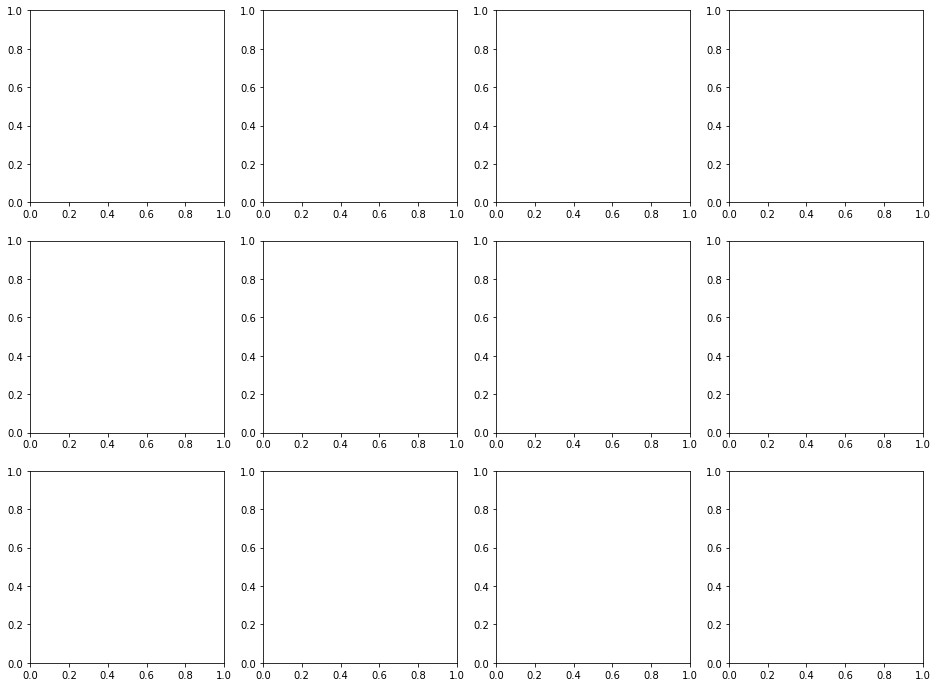

In [120]:
show_training_data()

# Train AI model

### Define Single Shot Detector (SSD) model architecture

In [22]:
class StdConv(nn.Module):
    def __init__(self, nin, nout, stride=2, drop=0.1):
        super().__init__()
        self.conv = nn.Conv2d(nin, nout, 3, stride=stride, padding=1)
        self.bn = nn.BatchNorm2d(nout)
        self.drop = nn.Dropout(drop)
        
    def forward(self, x): return self.drop(self.bn(F.relu(self.conv(x))))
        
def flatten_conv(x, k):
    bs, nf, gx, gy = x.size()                # batch size, num filters, width, height
    x = x.permute(0, 3, 2, 1).contiguous()   # batch_size, 
    return x.view(bs, -1, nf//k)

class OutConv(nn.Module):
    def __init__(self, k, nin, bias):
        super().__init__()
        self.k = k
        self.oconv1 = nn.Conv2d(nin, (len(id2cat)+1)*k, 3, padding=1) # nclasses
        self.oconv2 = nn.Conv2d(nin, 4*k, 3, padding=1) # bboxes
        self.oconv1.bias.data.zero_().add_(bias)
        
    def forward(self, x):
        return [flatten_conv(self.oconv1(x), self.k),
                flatten_conv(self.oconv2(x), self.k)]


class SSD_MultiHead(nn.Module):
    def __init__(self, k, bias):
        super().__init__()
        self.drop = nn.Dropout(drop)
        self.sconv0 = StdConv(512,256, stride=1, drop=drop)
        self.sconv1 = StdConv(256,256, drop=drop)
        self.sconv2 = StdConv(256,256, drop=drop)
        self.sconv3 = StdConv(256,256, drop=drop)
        self.out0 = OutConv(k, 256, bias)
        self.out1 = OutConv(k, 256, bias)
        self.out2 = OutConv(k, 256, bias)
        self.out3 = OutConv(k, 256, bias)

    def forward(self, x):
        x = self.drop(F.relu(x))
        x = self.sconv0(x)
        x = self.sconv1(x)
        o1c,o1l = self.out1(x)
        x = self.sconv2(x)
        o2c,o2l = self.out2(x)
        x = self.sconv3(x)
        o3c,o3l = self.out3(x)
        return [torch.cat([o1c, o2c, o3c], dim=1),
                torch.cat([o1l, o2l, o3l], dim=1)]
    


In [23]:
# converts height width to corners
def hw2corners(ctr, hw): 
    return torch.cat([ctr-hw/2, ctr+hw/2], dim=1)

anc_grids = [4,2,1]
anc_zooms = [0.7, 1., 1.3]
anc_ratios = [(1.,1.), (1.,0.5), (0.5,1.)]
anchor_scales = [(anz*i,anz*j) for anz in anc_zooms for (i,j) in anc_ratios]
k = len(anchor_scales)
anc_offsets = [1/(o*2) for o in anc_grids]

anc_x = np.concatenate([np.repeat(np.linspace(ao, 1-ao, ag), ag)
                        for ao,ag in zip(anc_offsets,anc_grids)])
anc_y = np.concatenate([np.tile(np.linspace(ao, 1-ao, ag), ag)
                        for ao,ag in zip(anc_offsets,anc_grids)])
anc_ctrs = np.repeat(np.stack([anc_x,anc_y], axis=1), k, axis=0)

anc_sizes  =   np.concatenate([np.array([[o/ag,p/ag] for i in range(ag*ag) for o,p in anchor_scales])
               for ag in anc_grids])
grid_sizes = V(np.concatenate([np.array([ 1/ag       for i in range(ag*ag) for o,p in anchor_scales])
               for ag in anc_grids]), requires_grad=False).unsqueeze(1)
anchors = V(np.concatenate([anc_ctrs, anc_sizes], axis=1), requires_grad=False).float()
anchor_cnr = hw2corners(anchors[:,:2], anchors[:,2:])

id2cat = list(categories.values())
cat2id = {v:k for k,v in enumerate(id2cat)}

n_clas = len(id2cat)+1
n_act = k*(4+n_clas)

n_clas, n_act

(3, 63)

In [110]:
id2cat = list(categories.values())
cat2id = {v:k for k,v in enumerate(id2cat)}

In [24]:
f_model = model # defining the base model for transfer learning
md = model_data # definig model data

drop=0.4

head_reg4 = SSD_MultiHead(k, -4.)
models = ConvnetBuilder(f_model, 0, 0, 0, custom_head=head_reg4)
learn = ConvLearner(md, models)
learn.opt_fn = optim.Adam

In [25]:
# defining the loss functions

def one_hot_embedding(labels, num_classes):
    return torch.eye(num_classes)[labels.data.cpu()]

class BCE_Loss(nn.Module):
    def __init__(self, num_classes):
        super().__init__()
        self.num_classes = num_classes

    def forward(self, pred, targ):
        t = one_hot_embedding(targ, self.num_classes+1)
        t = V(t[:,:-1].contiguous())#.cpu()
        x = pred[:,:-1]
        w = self.get_weight(x,t)
        return F.binary_cross_entropy_with_logits(x, t, w, size_average=False)/self.num_classes
    
    def get_weight(self,x,t): return None

loss_f = BCE_Loss(len(id2cat))

def intersect(box_a, box_b):
    max_xy = torch.min(box_a[:, None, 2:], box_b[None, :, 2:])
    min_xy = torch.max(box_a[:, None, :2], box_b[None, :, :2])
    inter = torch.clamp((max_xy - min_xy), min=0)
    return inter[:, :, 0] * inter[:, :, 1]

def box_sz(b): return ((b[:, 2]-b[:, 0]) * (b[:, 3]-b[:, 1]))

def jaccard(box_a, box_b):
    try:
        inter = intersect(box_a, box_b)
        union = box_sz(box_a).unsqueeze(1) + box_sz(box_b).unsqueeze(0) - inter
        return inter / union
    except:
        return 0.

def get_y(bbox,clas):
    bbox = bbox.view(-1,4)/sz
    try:
        xx = ((bbox[:,2]-bbox[:,0])>0).nonzero()
        #print(xx)
        bb_keep = xx[:,0]
    except:
        # print('No bboxes')
        return None, None
    
    #xx = ((bbox[:,2]-bbox[:,0])>0).nonzero()
    #bb_keep = xx[:,0]
    
    return bbox[bb_keep], clas[bb_keep]

def actn_to_bb(actn, anchors):
    actn_bbs = torch.tanh(actn)
    actn_centers = (actn_bbs[:,:2]/2 * grid_sizes) + anchors[:,:2]
    actn_hw = (actn_bbs[:,2:]/2+1) * anchors[:,2:] # [-1, 1]/2 + 1 = [0.5, 1.5] * anchor ht, w
    return hw2corners(actn_centers, actn_hw)

def map_to_ground_truth(overlaps, print_it=False):
    prior_overlap, prior_idx = overlaps.max(1)
    if print_it: print(prior_overlap)
#     pdb.set_trace()
    gt_overlap, gt_idx = overlaps.max(0)
    gt_overlap[prior_idx] = 1.99
    for i,o in enumerate(prior_idx): gt_idx[o] = i
    return gt_overlap,gt_idx

def ssd_1_loss(b_c, b_bb, bbox, clas, print_it=False):
    bbox, clas = get_y(bbox, clas)             # bbox, class from target
    if bbox is None:
        return 0.0, 0.0
    a_ic = actn_to_bb(b_bb, anchors)           # predicted bbox
    overlaps = jaccard(bbox.data, anchor_cnr.data)
    gt_overlap,gt_idx = map_to_ground_truth(overlaps,print_it)
    gt_clas = clas[gt_idx]
    pos = gt_overlap > 0.4
    pos_idx = torch.nonzero(pos)[:,0]
    gt_clas[1-pos] = len(id2cat)
    gt_bbox = bbox[gt_idx]
    loc_loss = ((a_ic[pos_idx] - gt_bbox[pos_idx]).abs()).mean()
    clas_loss  = loss_f(b_c, gt_clas)  # binary cross entropy
    return loc_loss, clas_loss

def ssd_loss(pred, targ, print_it=False):
    lcs, lls = 0.,0. # class loss, location loss
    for b_c, b_bb, bbox, clas in zip(*pred, *targ): 
        loc_loss, clas_loss = ssd_1_loss(b_c, b_bb, bbox, clas, print_it)
        lls += loc_loss
        lcs += clas_loss
    if print_it: print(f'loc: {lls.data[0]}, clas: {lcs.data[0]}')
    return lls+lcs

In [26]:
anchors = anchors.cuda();
grid_sizes = grid_sizes.cuda(); 
anchor_cnr = anchor_cnr.cuda()

In [28]:
learn.crit = ssd_loss
lr = 2e-3
lrs = np.array([lr/100,lr/10,lr])

In [29]:
def draw_torch_img(ax, ima, bbox, clas, prs=None, thresh=0.4):
    return draw_img_bboxes(ax, ima, to_np((bbox*224).long()),
         to_np(clas), to_np(prs) if prs is not None else None, thresh)

In [30]:
def map_to_ground_truth(overlaps, print_it=False):
    prior_overlap, prior_idx = overlaps.max(1)

    gt_overlap, gt_idx = overlaps.max(0)
    gt_overlap[prior_idx] = 1.99
    for i,o in enumerate(prior_idx): 
        gt_idx[o] = i
    return gt_overlap, gt_idx

### Train model using labeled training data

 82%|████████▏ | 439/535 [06:55<01:30,  1.06it/s, loss=1.65e+03]

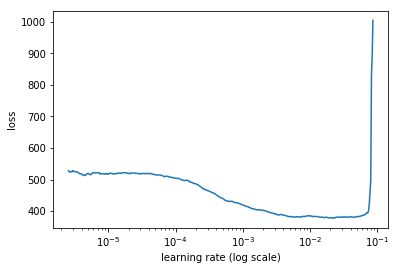

In [31]:
learn.lr_find(lrs/1000,1.)
learn.sched.plot(n_skip_end=2)

In [32]:
learn.fit(lrs, 1, cycle_len=4, use_clr=(20,8))

epoch      trn_loss   val_loss                             
    0      337.864613 346.85675 
    1      320.726742 323.307302                           
    2      311.509395 308.859668                           
    3      300.618155 301.066544                           


[array([301.06654])]

In [33]:
learn.fit(lrs, 1, cycle_len=4, use_clr=(20,8))

epoch      trn_loss   val_loss                             
    0      313.978933 311.850671
    1      301.512572 300.013124                           
    2      297.695647 292.309627                           
    3      292.759386 287.246896                           


[array([287.2469])]

In [34]:
# Freeze all layers except last two(run it twice)
learn.freeze_to(-2)
learn.fit(lrs/2, 1, cycle_len=4, use_clr=(20,8))

epoch      trn_loss   val_loss                             
    0      227.917222 216.852186
    1      185.993429 182.37386                            
    2      166.873789 162.999323                           
    3      157.565379 154.84248                            


[array([154.84248])]

In [35]:
learn.save('1')

In [36]:
learn.fit(lrs/2, 1, cycle_len=4, use_clr=(20,8))

epoch      trn_loss   val_loss                             
    0      153.992527 157.399303
    1      136.02626  133.953456                           
    2      120.25274  123.363848                           
    3      112.831957 117.596168                           


[array([117.59617])]

In [37]:
learn.save('2')

In [38]:
def plot_results(thresh):
    x,y = next(iter(md.val_dl))
    y = V(y)
    batch = learn.model(V(x))
    b_clas,b_bb = batch

    x = to_np(x)
    fig, axes = plt.subplots(3, 4, figsize=(16, 12))
    for idx,ax in enumerate(axes.flat):
        ima=md.val_ds.ds.denorm(x)[idx]
        bbox,clas = get_y(y[0][idx], y[1][idx])
        a_ic = actn_to_bb(b_bb[idx], anchors)
        clas_pr, clas_ids = b_clas[idx].max(1)
        clas_pr = clas_pr.sigmoid()
        draw_torch_img(ax, ima, a_ic, clas_ids, clas_pr, clas_pr.max().data[0]*thresh)
    plt.tight_layout()

#changing loss function to focal loss    
class FocalLoss(BCE_Loss):
    def get_weight(self,x,t):
        alpha,gamma = 0.25,1
        p = x.sigmoid()
        pt = p*t + (1-p)*(1-t)
        w = alpha*t + (1-alpha)*(1-t)
        return w * (1-pt).pow(gamma)

loss_f = FocalLoss(len(id2cat))

 79%|███████▉  | 425/535 [08:27<02:11,  1.19s/it, loss=357] 

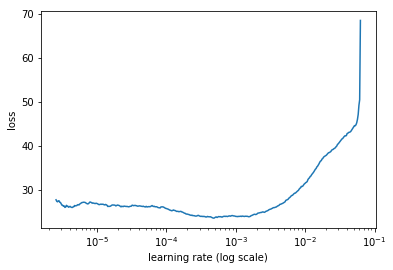

In [39]:
learn.lr_find(lrs/1000,1.)
learn.sched.plot(n_skip_end=1)

In [40]:
learn.fit(lrs/10, 1, cycle_len=5, use_clr=(20,10))

epoch      trn_loss   val_loss                              
    0      22.77191   23.646414 
    1      22.089149  22.884315                             
    2      21.550243  22.596447                             
    3      21.181429  22.310159                             
    4      20.463331  22.345418                             


[array([22.34542])]

In [41]:
learn.save('3')

In [42]:
learn.freeze_to(-2)
learn.fit(lrs/50, 1, cycle_len=4, use_clr=(20,10))

epoch      trn_loss   val_loss                              
    0      20.162061  22.176552 
    1      19.874362  22.097603                             
    2      19.599285  22.07266                              
    3      20.006354  22.038856                             


[array([22.03886])]

In [43]:
learn.save('4')

In [46]:
learn.load('4')

In [44]:
# unfreeze all layers and fine tune the complete model
learn.unfreeze()
learn.fit(lrs/250, 1, cycle_len=4, use_clr=(20,10))

epoch      trn_loss   val_loss                              
    0      21.137558  22.871866 
    1      21.266823  22.809822                             
    2      20.967619  22.770035                             
    3      21.225918  22.812954                             


[array([22.81295])]

In [45]:
learn.save('5')

# Evaluate results

### Detect panels in validation set

In [47]:
# the non maximal suppression function
def nms(boxes, scores, overlap=0.5, top_k=100):
    keep = scores.new(scores.size(0)).zero_().long()
    if boxes.numel() == 0:
        return keep
    x1 = boxes[:, 0]
    y1 = boxes[:, 1]
    x2 = boxes[:, 2]
    y2 = boxes[:, 3]
    area = torch.mul(x2 - x1, y2 - y1)
    v, idx = scores.sort(0)  # sort in ascending order
    idx = idx[-top_k:]  # indices of the top-k largest vals
    xx1 = boxes.new()
    yy1 = boxes.new()
    xx2 = boxes.new()
    yy2 = boxes.new()
    w = boxes.new()
    h = boxes.new()

    count = 0
    while idx.numel() > 0:
        i = idx[-1]  # index of current largest val
        keep[count] = i
        count += 1
        if idx.size(0) == 1: break
        idx = idx[:-1]  # remove kept element from view
        # load bboxes of next highest vals
        torch.index_select(x1, 0, idx, out=xx1)
        torch.index_select(y1, 0, idx, out=yy1)
        torch.index_select(x2, 0, idx, out=xx2)
        torch.index_select(y2, 0, idx, out=yy2)
        # store element-wise max with next highest score
        xx1 = torch.clamp(xx1, min=x1[i])
        yy1 = torch.clamp(yy1, min=y1[i])
        xx2 = torch.clamp(xx2, max=x2[i])
        yy2 = torch.clamp(yy2, max=y2[i])
        w.resize_as_(xx2)
        h.resize_as_(yy2)
        w = xx2 - xx1
        h = yy2 - yy1
        # check sizes of xx1 and xx2.. after each iteration
        w = torch.clamp(w, min=0.0)
        h = torch.clamp(h, min=0.0)
        inter = w*h
        # IoU = i / (area(a) + area(b) - i)
        rem_areas = torch.index_select(area, 0, idx)  # load remaining areas)
        union = (rem_areas - inter) + area[i]
        IoU = inter/union  # store result in iou
        # keep only elements with an IoU <= overlap
        idx = idx[IoU.le(overlap)]
    return keep, count

In [48]:
# take out a batch
x,y = next(iter(md.val_dl))
y = V(y)
batch = learn.model(V(x))
b_clas,b_bb = batch
x = to_np(x)

In [49]:
# non maximal suppression with comparisons
def show_results(idx, thresh=0.25, overlap=0.1):
    ima=md.val_ds.ds.denorm(x)[idx]
    bbox,clas = get_y(y[0][idx], y[1][idx])
    a_ic = actn_to_bb(b_bb[idx], anchors)
    clas_pr, clas_ids = b_clas[idx].max(1)
    clas_pr = clas_pr.sigmoid()

    conf_scores = b_clas[idx].sigmoid().t().data

    out1,out2,cc = [],[],[]
    for cl in range(0, len(conf_scores)-1):
        c_mask = conf_scores[cl] > thresh
        if c_mask.sum() == 0: continue
        scores = conf_scores[cl][c_mask]
        l_mask = c_mask.unsqueeze(1).expand_as(a_ic)
        boxes = a_ic[l_mask].view(-1, 4)
        ids, count = nms(boxes.data, scores, overlap, 50)
        ids = ids[:count]
        out1.append(scores[ids])
        out2.append(boxes.data[ids])
        cc.append([cl]*count)
    if cc == []:
        cc = [[0]]
    if out1 == []:
        out1 = [torch.Tensor()]
    if out2 == []:
        out2 = [torch.Tensor()]
    cc = T(np.concatenate(cc))
    out1 = torch.cat(out1)
    out2 = torch.cat(out2)

    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 45))
    
    torch_gt(ax2, ima, out2, cc, out1, 0.)
    title1_str = '# of predicted objects: '+ str(len([x for x in out1 if x > 0]))
    ax2.text(0,-10,title1_str)
    
    if bbox is None:
        bbox = torch.Tensor([0,0,0, 0])
    if clas is None:
        clas = torch.Tensor(0)
    torch_gt(ax3, ima, bbox, clas, None, 0.)
    title2_str = '# of ground truth objects: '+ str(len(clas))
    ax3.text(0,-10,title2_str)
    
    show_img(ima, ax=ax1)
    title3_str = md.val_ds.ds.fnames[i]
    ax1.text(0,-10,title3_str)
    ax1.grid(False)    
    
def torch_gt(ax, ima, bbox, clas, prs=None, thresh=0.4):
    return show_ground_truth(ax, ima, to_np((bbox*224).long()),
         to_np(clas), to_np(prs) if prs is not None else None, thresh)

def show_ground_truth(ax, im, bbox, clas=None, prs=None, thresh=0.3):
    bb = [bb_hw(o) for o in bbox.reshape(-1,4)]
    if prs is None:  prs  = [None]*len(bb)
    if clas is None: clas = [None]*len(bb)
    ax = show_img(im, ax=ax)
    for i,(b,c,pr) in enumerate(zip(bb, clas, prs)):
        if((b[2]>0) and (pr is None or pr > thresh)):
            draw_rect(ax, b, color=colr_list[i%num_colr])
            txt = f''
#             print(c)
            if c is not None: txt += ('bg' if c==len(id2cat) else id2cat[c])
            if pr is not None: txt += f' {pr:.2f}'
            draw_text(ax, b[:2], txt, color=colr_list[i%num_colr])    
            
def bb_hw(a): return np.array([a[1],a[0],a[3]-a[1]+1,a[2]-a[0]+1])
def show_img(im, figsize=None, ax=None):
    if not ax: fig,ax = plt.subplots(figsize=figsize)
    ax.imshow(im)
    ax.set_xticks(np.linspace(0, 224, 8))
    ax.set_yticks(np.linspace(0, 224, 8))
#     ax.grid()
    ax.set_yticklabels([])
    ax.set_xticklabels([])
    return ax

def draw_outline(o, lw):
    o.set_path_effects([patheffects.Stroke(
        linewidth=lw, foreground='black'), patheffects.Normal()])

def draw_rect(ax, b, color='white'):
    patch = ax.add_patch(patches.Rectangle(b[:2], *b[-2:], fill=False, edgecolor=color, lw=2))
    draw_outline(patch, 4)

def draw_text(ax, xy, txt, sz=14, color='white'):
    text = ax.text(*xy, txt,
        verticalalignment='top', color=color, fontsize=sz, weight='bold')
    draw_outline(text, 1)
    
def get_cmap(N):
    color_norm  = mcolors.Normalize(vmin=0, vmax=N-1)
    return cmx.ScalarMappable(norm=color_norm, cmap='Set3').to_rgba

num_colr = 12
cmap = get_cmap(num_colr)
colr_list = [cmap(float(x)) for x in range(num_colr)]   

### Compare image, predictions and ground truth

/home/ubuntu/src/anaconda3/envs/fastai/lib/python3.6/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


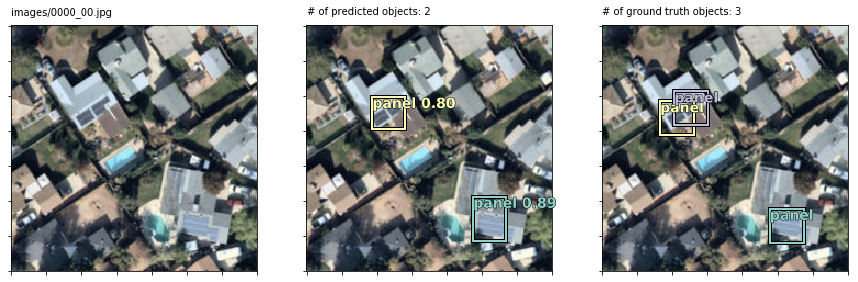

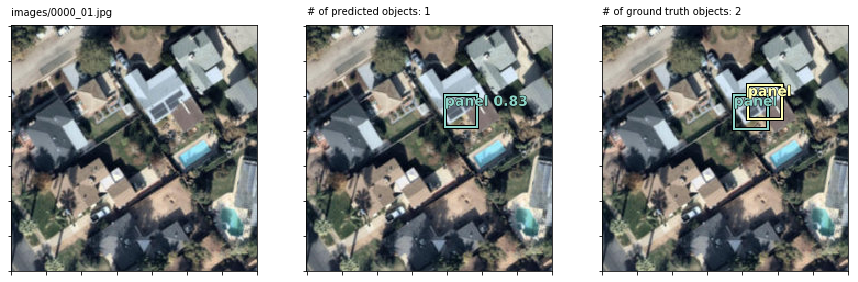

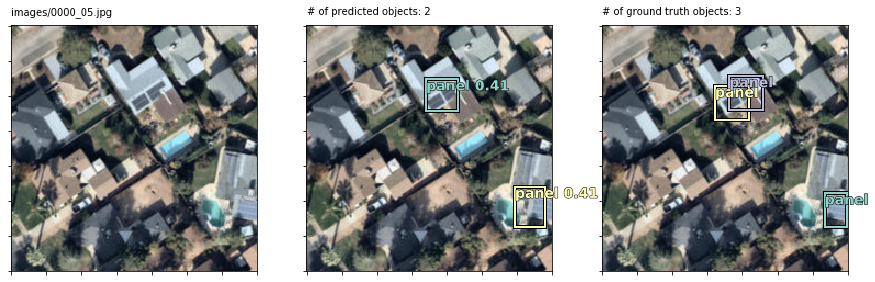

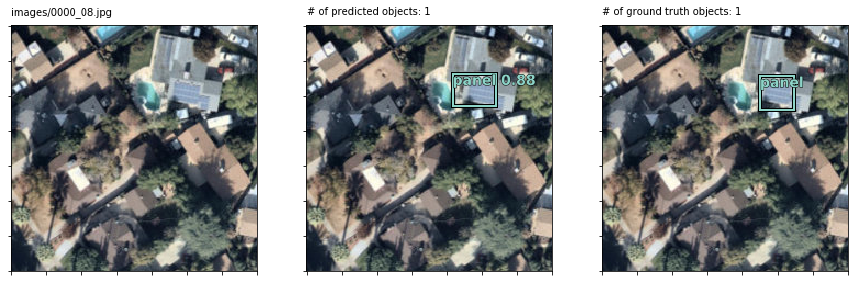

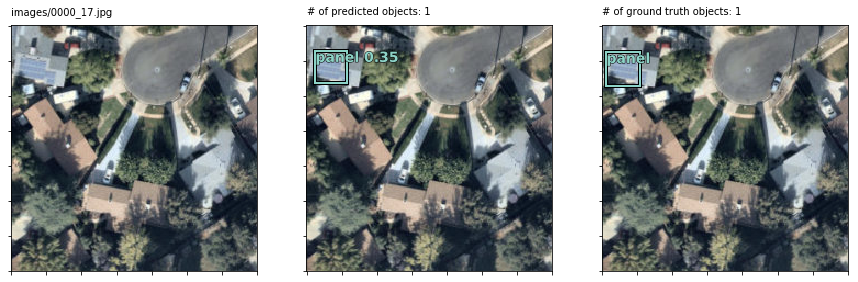

...

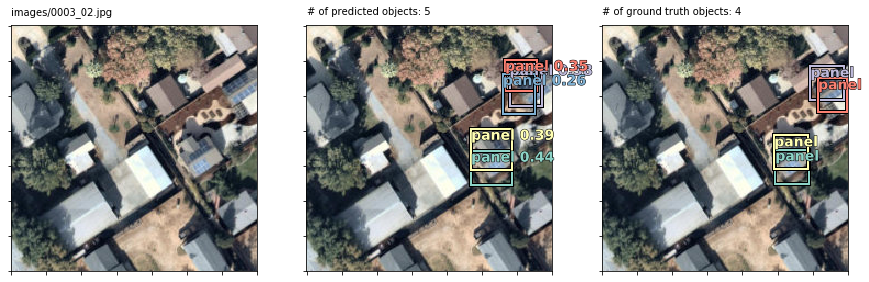

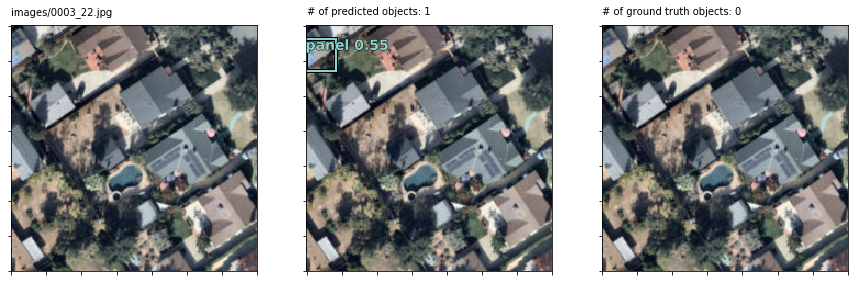

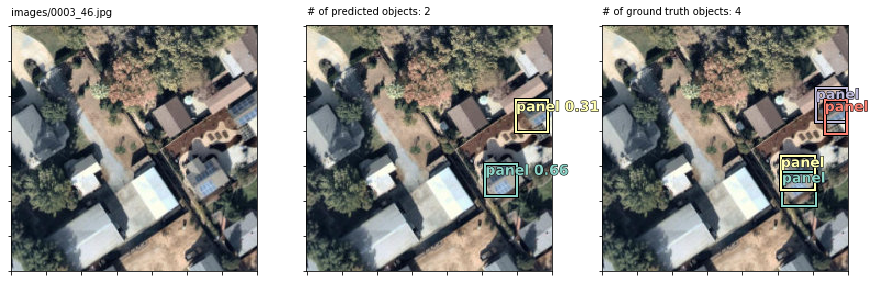

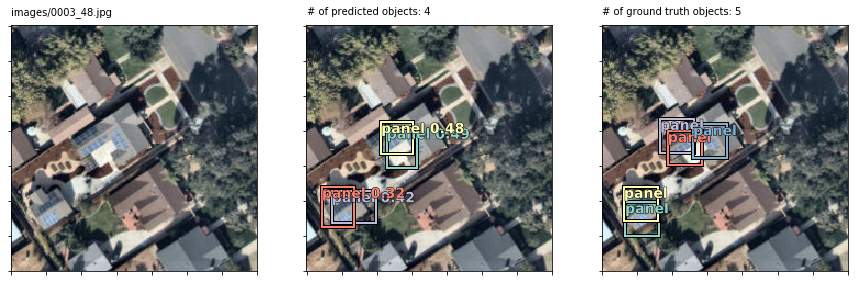

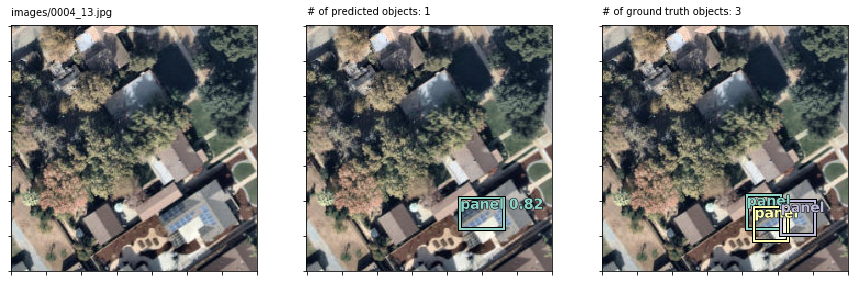

In [112]:
for i in range(30):
    show_results(i, overlap=0.5)

# Test model

### Define area of interest

In [82]:
from arcgis.gis import GIS
from arcgis.features import SpatialDataFrame
from arcgis.raster import ImageryLayer
from arcgis.raster.functions import apply
from PIL import Image
import os

gis = GIS('https://deldev.maps.arcgis.com', 'demo_deldev', os.environ.get('DEMOSPWD'))

<Item title:"World Imagery" type:Map Image Layer owner:esri>
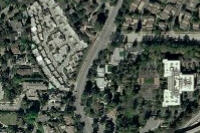

In [83]:
imagery = gis.content.search('title:World Imagery', 'Map Service', outside_org=True)[1]
imagery

In [87]:
from arcgis.mapping import MapImageLayer
lyr = MapImageLayer.fromitem(imagery)

In [113]:
PATH = Path('/home/ubuntu/courses_from_geonuma/courses/dl2/solarpanel/panel50/naipimg/')
filename = 'redlands.jpg'     

xmid = -13041888.801873
ymid = 4033154.412982

xmin, ymin = xmid - 80*4, ymid - 80*4
xmax, ymax = xmid + 80*4, ymid + 80*4

ext = {'xmin':xmin, 'ymin':ymin, 'xmax':xmax, 'ymax':ymax, 'spatialReference':3857}
imgpath = lyr.export_map(ext, image_sr={'wkid': 4326},
                      bbox_sr=3857, size='1792,1792', f='image', image_format='jpg', 
                      save_folder=PATH,
                      save_file=filename)

In [114]:
def get_img(filename):
    return np.array(Image.open(filename))

def get_tile_images(image, width=224, height=224):
    _nrows, _ncols, depth = image.shape
    _size = image.size
    _strides = image.strides

    nrows, _m = divmod(_nrows, height)
    ncols, _n = divmod(_ncols, width)
    if _m != 0 or _n != 0:
        return None

    return np.lib.stride_tricks.as_strided(
        np.ravel(image),
        shape=(nrows, ncols, height, width, depth),
        strides=(height * _strides[0], width * _strides[1], *_strides),
        writeable=False)

def predict_(model,images):
    images = V(images)
    if not len(images.size()) > 3:
        images.data = images.data.view(1,*images.size())
    bbox,clas = model(images)
    return bbox,clas

imagenet_stats = A([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])

mean = 255* np.array(imagenet_stats[0], dtype=np.float32)
std  = 255* np.array(imagenet_stats[1], dtype=np.float32)

norm = lambda x: (x-mean)/ std
denorm = lambda x: x * std + mean

learn.model.eval();

In [121]:
PATH/filename

PosixPath('/home/ubuntu/courses_from_geonuma/courses/dl2/solarpanel/panel50/naipimg/redlands.jpg')

In [115]:
img = get_img(PATH/filename)
_nrows = int(img.shape[0] / 224)
_ncols = int(img.shape[1] / 224)
img = get_tile_images(img)
img = img.reshape(64,224,224,3)
img_normed = norm(img)

In [116]:
clas, bbox = predict_(learn.model,img_normed.transpose(0,3,1,2))

In [117]:
def visualize_results(images,b_clas,b_bb,idx,anchors,ax1):
    ax1.set_axis_off()
    if not len(images.shape) > 3:
        images = images[np.newaxis,:]
    ima = denorm(images[idx]).astype(int)
    
#     bbox,clas = get_y(y[0][idx], y[1][idx])
    a_ic = actn_to_bb(b_bb[idx], anchors)
    clas_pr, clas_ids = b_clas[idx].max(1)
    clas_pr = clas_pr.sigmoid()

    conf_scores = b_clas[idx].sigmoid().t().data

    out1, out2, cc = [], [], []
    for cl in range(0, len(conf_scores)-1):
        c_mask = conf_scores[cl] > 0.1
        if c_mask.sum() == 0: continue
        scores = conf_scores[cl][c_mask]
        l_mask = c_mask.unsqueeze(1).expand_as(a_ic)
        boxes = a_ic[l_mask].view(-1, 4)
        ids, count = nms(boxes.data, scores, 0.1, 50)
        ids = ids[:count]
        out1.append(scores[ids])
        out2.append(boxes.data[ids])
        cc.append([cl]*count)
#         print(cc)
#     print(cc)
    if cc == []:
        cc = [[0]]
    cc = T(np.concatenate(cc))
#     print(out1)
    if out1 == []:
        out1 = [torch.Tensor()]
    out1 = torch.cat(out1)
    if out2 == []:
        out2 = [torch.Tensor()]
    out2 = torch.cat(out2)
    
    torch_gt(ax1, ima, out2, cc, out1, 0.)


### Detect panels in area of interest

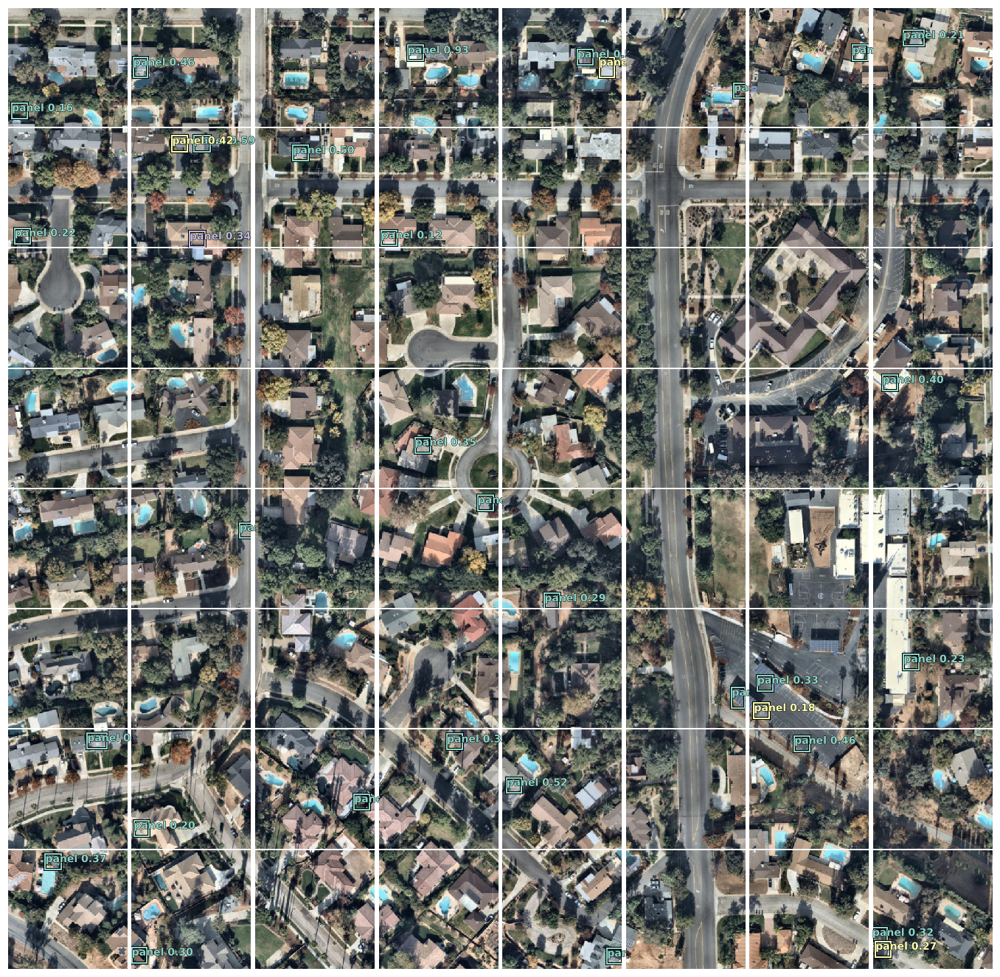

In [119]:
fig, ax = plt.subplots(nrows=_nrows, ncols=_ncols, figsize=(24, 24))
plt.subplots_adjust(hspace=0.01, wspace=0.01)

for idx in range(bbox.size()[0]): 
    
    visualize_results(img_normed, clas, bbox, idx, anchors, ax[idx//8, idx%8])